#  1. Imports

In [115]:
import pandas as pd
import numpy as np
import os

#Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil

#To get plots with better resolution 
%config InlineBackend.figure_format = 'retina'

#DBSCAN
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from collections import Counter

#Data Normalization, One-Hot encoding
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder

#K-Means Clustering
from os.path import join
import matplotlib.cm as cm
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import KMeans

sns.set()

#K-Mode Clustering
!pip install kmodes
from kmodes.kmodes import KModes

#Hierarchical Clustering
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

#2 perspectives Clustering
from sklearn.base import clone
from sklearn.cluster import AgglomerativeClustering

In [2]:
df = pd.read_csv('XYZ_sports_dataset.csv', sep=';')

# 2. Data Exploration

In [3]:
df

,ID,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
0,10000,60,Female,5500.0,2019-09-03,2019-10-31,2019-07-01,2019-12-31,2019-10-30,1,...,0.0,9.0,7,NaN,6.28,2,0,0.0,0,0
1,10001,29,Female,2630.0,2014-08-12,2015-09-14,2015-01-01,2015-12-31,2015-07-16,60,...,0.0,23.0,1,2.0,17.42,1,2,0.0,0,1
2,10002,23,Male,1980.0,2017-05-02,2017-06-01,2017-01-01,2017-06-30,2017-05-25,7,...,0.0,6.0,0,7.0,30.03,6,0,0.0,0,1
3,10003,9,Male,0.0,2018-09-05,2019-02-12,2018-07-01,2019-06-30,2019-01-21,22,...,0.0,20.0,2,2.0,17.72,3,0,0.0,0,1
4,10004,35,Male,4320.0,2016-04-20,2018-06-07,2018-01-01,2018-06-30,2017-11-09,210,...,NaN,41.0,0,7.0,60.97,0,3,0.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14937,24937,14,Male,0.0,2016-09-08,2016-09-08,2019-07-01,2019-12-31,2019-10-29,2,...,0.0,112.0,96,4.0,34.84,8,3,0.0,0,0
14938,24938,39,Male,NaN,2015-09-17,2016-06-04,2016-01-01,2016-06-30,2016-04-27,38,...,0.0,57.0,0,7.0,60.97,3,0,0.0,0,1
14939,24939,20,Male,1810.0,2017-03-01,2017-03-31,2017-01-01,2017-06-30,2017-03-29,2,...,0.0,6.0,0,7.0,30.03,8,0,0.0,0,1
14940,24940,55,Male,4800.0,2018-03-01,2018-03-01,2019-07-01,2019-12-31,2019-10-28,3,...,0.0,185.0,155,3.0,15.87,7,2,0.0,0,0


In [4]:
df.shape

(14942, 31)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14942 entries, 0 to 14941
Data columns (total 31 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          14942 non-null  int64  
 1   Age                         14942 non-null  int64  
 2   Gender                      14942 non-null  object 
 3   Income                      14447 non-null  float64
 4   EnrollmentStart             14942 non-null  object 
 5   EnrollmentFinish            14942 non-null  object 
 6   LastPeriodStart             14942 non-null  object 
 7   LastPeriodFinish            14942 non-null  object 
 8   DateLastVisit               14942 non-null  object 
 9   DaysWithoutFrequency        14942 non-null  int64  
 10  LifetimeValue               14942 non-null  float64
 11  UseByTime                   14942 non-null  int64  
 12  AthleticsActivities         14906 non-null  float64
 13  WaterActivities             149

Observing this, we will have to:
- Correct some data types
- Fill missing values

In [6]:
#Define metric and non-metric features
non_metric_features = ['Gender','EnrollmentStart','EnrollmentFinish','LastPeriodStart','LastPeriodFinish','DateLastVisit',
                       'UseByTime','AthleticsActivities', 'WaterActivities', 'FitnessActivities', 'DanceActivities',
                       'TeamActivities', 'RacketActivities', 'CombatActivities', 'NatureActivities',
                       'SpecialActivities', 'OtherActivities', 'HasReferences', 'Dropout']

metric_features = df.columns.drop(non_metric_features).to_list()

print("These are the non metric features:", non_metric_features)
print("These are the metric features:", metric_features)

These are the non metric features: ['Gender', 'EnrollmentStart', 'EnrollmentFinish', 'LastPeriodStart', 'LastPeriodFinish', 'DateLastVisit', 'UseByTime', 'AthleticsActivities', 'WaterActivities', 'FitnessActivities', 'DanceActivities', 'TeamActivities', 'RacketActivities', 'CombatActivities', 'NatureActivities', 'SpecialActivities', 'OtherActivities', 'HasReferences', 'Dropout']
These are the metric features: ['ID', 'Age', 'Income', 'DaysWithoutFrequency', 'LifetimeValue', 'NumberOfFrequencies', 'AttendedClasses', 'AllowedWeeklyVisitsBySLA', 'AllowedNumberOfVisitsBySLA', 'RealNumberOfVisits', 'NumberOfRenewals', 'NumberOfReferences']


## 2.1. Identifying possible errors

Check the unique values of each variable.

In [7]:
df.Age.value_counts() 

Age
22    1187
21    1166
20     987
23     954
19     899
      ... 
79       4
85       3
84       2
86       1
87       1
Name: count, Length: 88, dtype: int64

In [8]:
df.Gender.value_counts() 

Gender
Female    8931
Male      6011
Name: count, dtype: int64

In [9]:
df.Income.value_counts() 

Income
0.0       2123
1890.0      84
1820.0      82
1970.0      80
1710.0      79
          ... 
8160.0       1
6510.0       1
6770.0       1
7810.0       1
6570.0       1
Name: count, Length: 737, dtype: int64

In [10]:
df.EnrollmentStart.value_counts() 

EnrollmentStart
2015-03-02    92
2018-10-01    71
2014-09-29    69
2015-03-03    67
2016-03-01    62
              ..
2016-08-12     1
2018-06-21     1
2018-07-18     1
2017-07-14     1
2014-07-18     1
Name: count, Length: 1490, dtype: int64

In [11]:
df.EnrollmentFinish.value_counts() 

EnrollmentFinish
2015-09-16    1684
2016-07-31     890
2018-07-31     800
2019-10-31     735
2017-08-29     541
              ... 
2016-04-13       1
2017-12-29       1
2018-08-24       1
2019-05-16       1
2014-12-10       1
Name: count, Length: 1300, dtype: int64

In [12]:
df.LastPeriodStart.value_counts() 

LastPeriodStart
2019-07-01    3172
2016-01-01    1919
2018-01-01    1870
2019-01-01    1734
2015-01-01    1504
2017-01-01    1448
2018-07-01     838
2016-07-01     727
2015-07-01     674
2017-07-01     619
2014-07-01     432
2014-01-01       5
Name: count, dtype: int64

In [13]:
df.LastPeriodFinish.value_counts() 

LastPeriodFinish
2019-12-31    3694
2018-12-31    1748
2016-12-31    1722
2019-06-30    1501
2016-06-30    1197
2015-06-30    1017
2017-06-30     991
2018-06-30     987
2017-12-31     931
2015-12-31     853
2014-12-31     301
Name: count, dtype: int64

In [14]:
df.DateLastVisit.value_counts() 

DateLastVisit
2019-10-31    475
2019-10-30    438
2019-10-26    304
2019-10-29    278
2019-10-28    218
             ... 
2019-02-13      1
2014-12-13      1
2015-01-16      1
2016-01-09      1
2014-07-31      1
Name: count, Length: 1384, dtype: int64

In [15]:
df.DaysWithoutFrequency.value_counts() 

DaysWithoutFrequency
0       604
1       563
5       393
2       380
3       349
       ... 
392       1
709       1
474       1
1249      1
461       1
Name: count, Length: 660, dtype: int64

In [16]:
df.LifetimeValue.value_counts() 

LifetimeValue
43.60      188
53.60      146
47.20      129
37.60      124
83.60      118
          ... 
635.30       1
143.90       1
1061.25      1
275.90       1
919.60       1
Name: count, Length: 5668, dtype: int64

In [17]:
df.UseByTime.value_counts() 

UseByTime
0    14238
1      704
Name: count, dtype: int64

In [18]:
df.AthleticsActivities.value_counts() 

AthleticsActivities
0.0    14796
1.0      110
Name: count, dtype: int64

In [19]:
df.WaterActivities.value_counts() 

WaterActivities
0.0    10490
1.0     4415
Name: count, dtype: int64

In [20]:
df.FitnessActivities.value_counts() 

FitnessActivities
1.0    8587
0.0    6320
Name: count, dtype: int64

In [21]:
df.DanceActivities.value_counts() 

#only has 1 as a value, se we can consider its removal

DanceActivities
0.0    14906
Name: count, dtype: int64

In [22]:
df.TeamActivities.value_counts() 

TeamActivities
0.0    14079
1.0      828
Name: count, dtype: int64

In [23]:
df.RacketActivities.value_counts() 

RacketActivities
0.0    14556
1.0      349
Name: count, dtype: int64

In [24]:
df.CombatActivities.value_counts() 

CombatActivities
0.0    13300
1.0     1609
Name: count, dtype: int64

In [25]:
df.NatureActivities.value_counts() 

#only has 1 as a value, se we can consider its removal

NatureActivities
0.0    14895
Name: count, dtype: int64

In [26]:
df.SpecialActivities.value_counts() 

SpecialActivities
0.0    14503
1.0      395
Name: count, dtype: int64

In [27]:
df.OtherActivities.value_counts() 

OtherActivities
0.0    14879
1.0       28
Name: count, dtype: int64

In [28]:
df.NumberOfFrequencies.value_counts() 

NumberOfFrequencies
2.0      661
3.0      623
1.0      609
4.0      583
5.0      556
        ... 
443.0      1
660.0      1
507.0      1
373.0      1
472.0      1
Name: count, Length: 415, dtype: int64

In [29]:
df.AttendedClasses.value_counts() 

AttendedClasses
0      10432
1        411
2        214
3        195
4        171
       ...  
268        1
312        1
139        1
290        1
202        1
Name: count, Length: 230, dtype: int64

In [30]:
df.AllowedWeeklyVisitsBySLA.value_counts() 

AllowedWeeklyVisitsBySLA
7.0    10505
2.0     2341
4.0      742
1.0      525
3.0      160
6.0      118
5.0       16
Name: count, dtype: int64

In [31]:
df.AllowedNumberOfVisitsBySLA.value_counts() 

AllowedNumberOfVisitsBySLA
60.97    4462
17.42    1497
30.03    1205
28.98    1138
62.02     646
         ... 
32.58       1
0.86        1
53.57       1
17.15       1
15.87       1
Name: count, Length: 270, dtype: int64

In [32]:
df.RealNumberOfVisits.value_counts() 

RealNumberOfVisits
0     2698
1     1641
2     1635
3     1440
4     1323
5     1045
6      913
7      711
8      611
9      466
10     376
11     348
12     263
13     210
14     163
15     142
16     138
17     114
18      87
19      73
20      65
21      49
22      48
24      44
25      42
23      39
26      31
27      24
29      21
34      20
28      20
30      18
33      14
32      13
31      13
35       9
36       8
39       7
40       6
37       6
38       5
41       5
45       5
46       4
42       4
49       3
72       3
47       3
66       2
43       2
84       2
51       2
44       1
53       1
50       1
58       1
52       1
48       1
57       1
56       1
Name: count, dtype: int64

In [33]:
df.NumberOfRenewals.value_counts() 

NumberOfRenewals
0    6103
1    4020
2    2347
3    1209
4     733
5     444
6      86
Name: count, dtype: int64

In [34]:
df.HasReferences.value_counts() 

HasReferences
0.0    14633
1.0      297
Name: count, dtype: int64

In [35]:
df.Dropout.value_counts() 

Dropout
1    11968
0     2974
Name: count, dtype: int64

## 2.2. Summary Statistics

In [36]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,14942.0,17470.500000,4313.528196,10000.00,13735.25,17470.50,21205.750,24941.00
Age,14942.0,26.015794,14.156582,0.00,19.00,23.00,31.000,87.00
Income,14447.0,2230.816086,1566.527734,0.00,1470.00,1990.00,2790.000,10890.00
DaysWithoutFrequency,14942.0,81.224936,144.199576,0.00,13.00,41.00,83.750,1745.00
LifetimeValue,14942.0,302.561871,364.319566,0.00,83.60,166.20,355.075,6727.80
UseByTime,14942.0,0.047116,0.211893,0.00,0.00,0.00,0.000,1.00
AthleticsActivities,14906.0,0.007380,0.085590,0.00,0.00,0.00,0.000,1.00
WaterActivities,14905.0,0.296209,0.456600,0.00,0.00,0.00,1.000,1.00
FitnessActivities,14907.0,0.576038,0.494201,0.00,0.00,1.00,1.000,1.00
DanceActivities,14906.0,0.000000,0.000000,0.00,0.00,0.00,0.000,0.00


In [37]:
df.describe(include = ['O']).T

,count,unique,top,freq
Gender,14942,2,Female,8931
EnrollmentStart,14942,1490,2015-03-02,92
EnrollmentFinish,14942,1300,2015-09-16,1684
LastPeriodStart,14942,12,2019-07-01,3172
LastPeriodFinish,14942,11,2019-12-31,3694
DateLastVisit,14942,1384,2019-10-31,475


# 3. Preprocessing

## 3.1. Duplicates

In [38]:
#Check if there are any duplicates
df.duplicated().sum()  

0

In [39]:
df.set_index('ID', inplace = True)

In [40]:
#Remove from metric_features
metric_features.remove("ID")

## 3.2. Missing values

In [41]:
#Count the NaN values/missing values
df.isna().sum()

Age                             0
Gender                          0
Income                        495
EnrollmentStart                 0
EnrollmentFinish                0
LastPeriodStart                 0
LastPeriodFinish                0
DateLastVisit                   0
DaysWithoutFrequency            0
LifetimeValue                   0
UseByTime                       0
AthleticsActivities            36
WaterActivities                37
FitnessActivities              35
DanceActivities                36
TeamActivities                 35
RacketActivities               37
CombatActivities               33
NatureActivities               47
SpecialActivities              44
OtherActivities                35
NumberOfFrequencies            26
AttendedClasses                 0
AllowedWeeklyVisitsBySLA      535
AllowedNumberOfVisitsBySLA      0
RealNumberOfVisits              0
NumberOfRenewals                0
HasReferences                  12
NumberOfReferences              0
Dropout       

In [42]:
#Percentage of NaN values/missing values
round(df.isna().sum()/len(df),5)*100

Age                           0.000
Gender                        0.000
Income                        3.313
EnrollmentStart               0.000
EnrollmentFinish              0.000
LastPeriodStart               0.000
LastPeriodFinish              0.000
DateLastVisit                 0.000
DaysWithoutFrequency          0.000
LifetimeValue                 0.000
UseByTime                     0.000
AthleticsActivities           0.241
WaterActivities               0.248
FitnessActivities             0.234
DanceActivities               0.241
TeamActivities                0.234
RacketActivities              0.248
CombatActivities              0.221
NatureActivities              0.315
SpecialActivities             0.294
OtherActivities               0.234
NumberOfFrequencies           0.174
AttendedClasses               0.000
AllowedWeeklyVisitsBySLA      3.581
AllowedNumberOfVisitsBySLA    0.000
RealNumberOfVisits            0.000
NumberOfRenewals              0.000
HasReferences               

### 3.2.1 Fill missing values 

In [43]:
#Modes of the non_metric_features
modes = df[non_metric_features].mode().loc[0]
modes

Gender                     Female
EnrollmentStart        2015-03-02
EnrollmentFinish       2015-09-16
LastPeriodStart        2019-07-01
LastPeriodFinish       2019-12-31
DateLastVisit          2019-10-31
UseByTime                       0
AthleticsActivities           0.0
WaterActivities               0.0
FitnessActivities             1.0
DanceActivities               0.0
TeamActivities                0.0
RacketActivities              0.0
CombatActivities              0.0
NatureActivities              0.0
SpecialActivities             0.0
OtherActivities               0.0
HasReferences                 0.0
Dropout                         1
Name: 0, dtype: object

In [44]:
#Medians of the metric_features
medians = df.median(numeric_only=True)
medians

Age                             23.00
Income                        1990.00
DaysWithoutFrequency            41.00
LifetimeValue                  166.20
UseByTime                        0.00
AthleticsActivities              0.00
WaterActivities                  0.00
FitnessActivities                1.00
DanceActivities                  0.00
TeamActivities                   0.00
RacketActivities                 0.00
CombatActivities                 0.00
NatureActivities                 0.00
SpecialActivities                0.00
OtherActivities                  0.00
NumberOfFrequencies             18.00
AttendedClasses                  0.00
AllowedWeeklyVisitsBySLA         7.00
AllowedNumberOfVisitsBySLA      38.99
RealNumberOfVisits               4.00
NumberOfRenewals                 1.00
HasReferences                    0.00
NumberOfReferences               0.00
Dropout                          1.00
dtype: float64

In [45]:
#Substituting missing values on the metric and non metric features by the median and the mode, respectively
df_central = df.copy()  
df_central.fillna(df_central.median(numeric_only=True), inplace=True)
df_central.fillna(modes, inplace=True)
df_central.isna().sum()  

Age                           0
Gender                        0
Income                        0
EnrollmentStart               0
EnrollmentFinish              0
LastPeriodStart               0
LastPeriodFinish              0
DateLastVisit                 0
DaysWithoutFrequency          0
LifetimeValue                 0
UseByTime                     0
AthleticsActivities           0
WaterActivities               0
FitnessActivities             0
DanceActivities               0
TeamActivities                0
RacketActivities              0
CombatActivities              0
NatureActivities              0
SpecialActivities             0
OtherActivities               0
NumberOfFrequencies           0
AttendedClasses               0
AllowedWeeklyVisitsBySLA      0
AllowedNumberOfVisitsBySLA    0
RealNumberOfVisits            0
NumberOfRenewals              0
HasReferences                 0
NumberOfReferences            0
Dropout                       0
dtype: int64

In [46]:
df2 = df_central.copy()
df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14942 entries, 10000 to 24941
Data columns (total 30 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         14942 non-null  int64  
 1   Gender                      14942 non-null  object 
 2   Income                      14942 non-null  float64
 3   EnrollmentStart             14942 non-null  object 
 4   EnrollmentFinish            14942 non-null  object 
 5   LastPeriodStart             14942 non-null  object 
 6   LastPeriodFinish            14942 non-null  object 
 7   DateLastVisit               14942 non-null  object 
 8   DaysWithoutFrequency        14942 non-null  int64  
 9   LifetimeValue               14942 non-null  float64
 10  UseByTime                   14942 non-null  int64  
 11  AthleticsActivities         14942 non-null  float64
 12  WaterActivities             14942 non-null  float64
 13  FitnessActivities           1494

In [47]:
df2

,Age,Gender,Income,EnrollmentStart,EnrollmentFinish,LastPeriodStart,LastPeriodFinish,DateLastVisit,DaysWithoutFrequency,LifetimeValue,...,OtherActivities,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout
ID,,,,,,,,,,,,,,,,,,,,,
10000,60,Female,5500.0,2019-09-03,2019-10-31,2019-07-01,2019-12-31,2019-10-30,1,89.35,...,0.0,9.0,7,7.0,6.28,2,0,0.0,0,0
10001,29,Female,2630.0,2014-08-12,2015-09-14,2015-01-01,2015-12-31,2015-07-16,60,479.20,...,0.0,23.0,1,2.0,17.42,1,2,0.0,0,1
10002,23,Male,1980.0,2017-05-02,2017-06-01,2017-01-01,2017-06-30,2017-05-25,7,37.60,...,0.0,6.0,0,7.0,30.03,6,0,0.0,0,1
10003,9,Male,0.0,2018-09-05,2019-02-12,2018-07-01,2019-06-30,2019-01-21,22,155.40,...,0.0,20.0,2,2.0,17.72,3,0,0.0,0,1
10004,35,Male,4320.0,2016-04-20,2018-06-07,2018-01-01,2018-06-30,2017-11-09,210,373.20,...,0.0,41.0,0,7.0,60.97,0,3,0.0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24937,14,Male,0.0,2016-09-08,2016-09-08,2019-07-01,2019-12-31,2019-10-29,2,1460.45,...,0.0,112.0,96,4.0,34.84,8,3,0.0,0,0
24938,39,Male,1990.0,2015-09-17,2016-06-04,2016-01-01,2016-06-30,2016-04-27,38,343.85,...,0.0,57.0,0,7.0,60.97,3,0,0.0,0,1
24939,20,Male,1810.0,2017-03-01,2017-03-31,2017-01-01,2017-06-30,2017-03-29,2,43.60,...,0.0,6.0,0,7.0,30.03,8,0,0.0,0,1


## 3.3. Check data types

In [48]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14942 entries, 10000 to 24941
Data columns (total 30 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         14942 non-null  int64  
 1   Gender                      14942 non-null  object 
 2   Income                      14942 non-null  float64
 3   EnrollmentStart             14942 non-null  object 
 4   EnrollmentFinish            14942 non-null  object 
 5   LastPeriodStart             14942 non-null  object 
 6   LastPeriodFinish            14942 non-null  object 
 7   DateLastVisit               14942 non-null  object 
 8   DaysWithoutFrequency        14942 non-null  int64  
 9   LifetimeValue               14942 non-null  float64
 10  UseByTime                   14942 non-null  int64  
 11  AthleticsActivities         14942 non-null  float64
 12  WaterActivities             14942 non-null  float64
 13  FitnessActivities           1494

### 3.3.1. Fix wrong data types

In [49]:
#These variables only have 0 and 1 as values 

df2.UseByTime = df2.UseByTime.astype("boolean")
df2.AthleticsActivities = df2.AthleticsActivities.astype("boolean")
df2.WaterActivities = df2.WaterActivities.astype("boolean")
df2.FitnessActivities = df2.FitnessActivities.astype("boolean")
df2.DanceActivities = df2.DanceActivities.astype("boolean")
df2.TeamActivities = df2.TeamActivities.astype("boolean")
df2.RacketActivities = df2.RacketActivities.astype("boolean")
df2.CombatActivities = df2.CombatActivities.astype("boolean")
df2.NatureActivities = df2.NatureActivities.astype("boolean")
df2.SpecialActivities = df2.SpecialActivities.astype("boolean")
df2.OtherActivities = df2.OtherActivities.astype("boolean")
df2.HasReferences = df2.HasReferences.astype("boolean")
df2.Dropout = df2.Dropout.astype("boolean") 


#Change the dates data type to datetime
datetime_columns= ["EnrollmentStart", "EnrollmentFinish", 
    "LastPeriodStart", "LastPeriodFinish", "DateLastVisit"]

for column in datetime_columns:
    df2[column] = pd.to_datetime(df2[column])

In [50]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14942 entries, 10000 to 24941
Data columns (total 30 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Age                         14942 non-null  int64         
 1   Gender                      14942 non-null  object        
 2   Income                      14942 non-null  float64       
 3   EnrollmentStart             14942 non-null  datetime64[ns]
 4   EnrollmentFinish            14942 non-null  datetime64[ns]
 5   LastPeriodStart             14942 non-null  datetime64[ns]
 6   LastPeriodFinish            14942 non-null  datetime64[ns]
 7   DateLastVisit               14942 non-null  datetime64[ns]
 8   DaysWithoutFrequency        14942 non-null  int64         
 9   LifetimeValue               14942 non-null  float64       
 10  UseByTime                   14942 non-null  boolean       
 11  AthleticsActivities         14942 non-null  boolean    

## 3.4. Outliers

C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

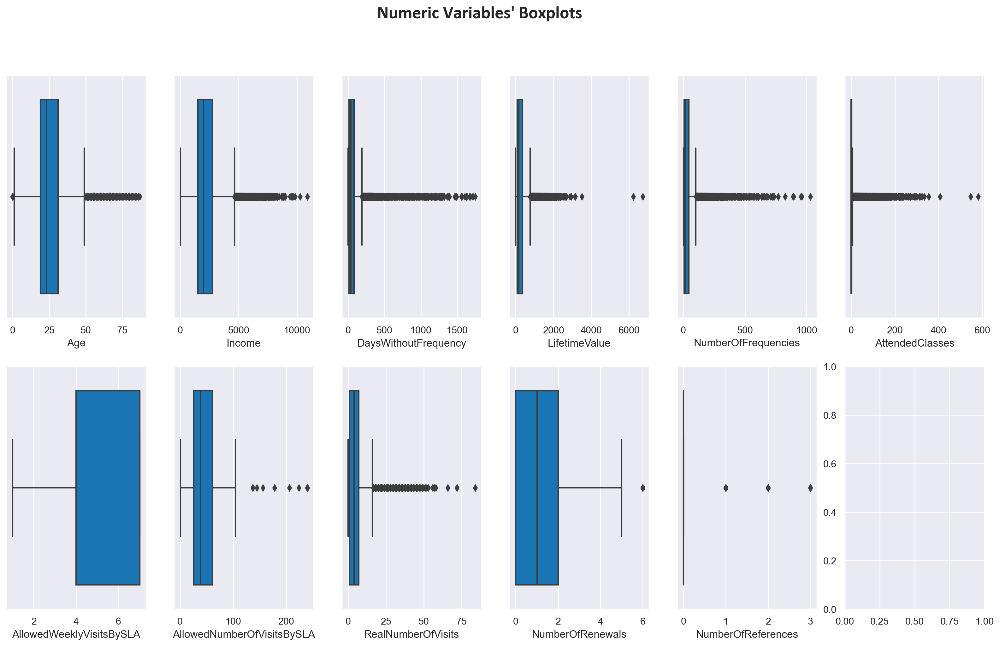

In [51]:
#Numeric Variables' Boxplots
sns.set()
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=df2[feat], ax=ax, color='#007acc')

title = "Numeric Variables' Boxplots"
plt.suptitle(title, size=20, weight='bold', family='Calibri')

plt.show()

In [52]:
# Number of rows in the original DataFrame
original_rows = len(df2)

# Apply filters and create a new DataFrame
filters1 = (
    (df2['Age'] <= 75) &
    (df2['Income'] <= 10000) &
    (df2['DaysWithoutFrequency'] <= 1000) &
    (df2['LifetimeValue'] <= 6000) &
    (df2['NumberOfFrequencies'] <= 1000) &
    (df2['AttendedClasses'] <= 500) &
    (df2['RealNumberOfVisits'] <= 75)
)

filtered_df = df2[filters1]

# Number of rows in the filtered DataFrame
filtered_rows = len(filtered_df)

# Calculate the percentage of data removed
percentage_removed = ((original_rows - filtered_rows) / original_rows) * 100

print(f"Percentage of data removed: {percentage_removed:.2f}%")

# Calculate the percentage of data remaining
percentage_remaining = (filtered_rows / original_rows) * 100

print(f"Percentage of data remaining: {percentage_remaining:.2f}%")

df3 = filtered_df.copy()

Percentage of data removed: 1.13%
Percentage of data remaining: 98.87%


In [53]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14773 entries, 10000 to 24941
Data columns (total 30 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Age                         14773 non-null  int64         
 1   Gender                      14773 non-null  object        
 2   Income                      14773 non-null  float64       
 3   EnrollmentStart             14773 non-null  datetime64[ns]
 4   EnrollmentFinish            14773 non-null  datetime64[ns]
 5   LastPeriodStart             14773 non-null  datetime64[ns]
 6   LastPeriodFinish            14773 non-null  datetime64[ns]
 7   DateLastVisit               14773 non-null  datetime64[ns]
 8   DaysWithoutFrequency        14773 non-null  int64         
 9   LifetimeValue               14773 non-null  float64       
 10  UseByTime                   14773 non-null  boolean       
 11  AthleticsActivities         14773 non-null  boolean    

## 3.5. Remove irrelevant variables

In [54]:
#Variables that only have 1 value, don't give any information
df3.drop(columns = ['NatureActivities'], inplace = True)
df3.drop(columns = ['DanceActivities'], inplace = True)

#Updating metric_features
non_metric_features.remove("NatureActivities")
non_metric_features.remove("DanceActivities")

In [55]:
#Check the non_metric_features
non_metric_features

['Gender',
 'EnrollmentStart',
 'EnrollmentFinish',
 'LastPeriodStart',
 'LastPeriodFinish',
 'DateLastVisit',
 'UseByTime',
 'AthleticsActivities',
 'WaterActivities',
 'FitnessActivities',
 'TeamActivities',
 'RacketActivities',
 'CombatActivities',
 'SpecialActivities',
 'OtherActivities',
 'HasReferences',
 'Dropout']

## 3.6. Feature Engineering

In [56]:
#Grouping the ages, adding a new column 'Age_groups' to the dataframe
df3['AgeGroups'] = pd.Series()

for i in range(len(df3)):
    if df3['Age'].iloc[i] < 11:
        df3['AgeGroups'].iloc[i] = 'Child'
    elif df3['Age'].iloc[i] < 21:
        df3['AgeGroups'].iloc[i] = 'Teenager'
    elif df3['Age'].iloc[i] < 31:
        df3['AgeGroups'].iloc[i] = 'Young Adult'
    elif df3['Age'].iloc[i] < 61:
        df3['AgeGroups'].iloc[i] = 'Adult'     
    else:
        df3['AgeGroups'].iloc[i] = 'Elderly'

C:\Users\emili\AppData\Local\Temp\ipykernel_5884\3466342976.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['AgeGroups'].iloc[i] = 'Adult'
C:\Users\emili\AppData\Local\Temp\ipykernel_5884\3466342976.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['AgeGroups'].iloc[i] = 'Young Adult'
C:\Users\emili\AppData\Local\Temp\ipykernel_5884\3466342976.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['AgeGroups'].iloc[i] 

In [57]:
#Updating non_metric_features
non_metric_features.append("AgeGroups")
non_metric_features

['Gender',
 'EnrollmentStart',
 'EnrollmentFinish',
 'LastPeriodStart',
 'LastPeriodFinish',
 'DateLastVisit',
 'UseByTime',
 'AthleticsActivities',
 'WaterActivities',
 'FitnessActivities',
 'TeamActivities',
 'RacketActivities',
 'CombatActivities',
 'SpecialActivities',
 'OtherActivities',
 'HasReferences',
 'Dropout',
 'AgeGroups']

In [58]:
#Total amount of days that someone has been enrolled
df3['TotalTimeOfEnrollment'] = (df3['EnrollmentFinish'] - df3['EnrollmentStart']).dt.days
df3['TotalTimeOfEnrollment']

ID
10000      58
10001     398
10002      30
10003     160
10004     778
         ... 
24937       0
24938     261
24939      30
24940       0
24941    1166
Name: TotalTimeOfEnrollment, Length: 14773, dtype: int64

In [59]:
from datetime import datetime

end_of_collection = datetime(2019, 10, 31) # This project will leverage the dataset provided by the company’s ERP system, which includes a wealth of customer-related data, collected between June 1st 2014 and October 31st 2019
df3['TimeSinceLastVisit'] = (end_of_collection - df3['DateLastVisit']).dt.days

# 3. Activity Periods: The difference in days between LastPeriodFinish and LastPeriodStart
df3['RecentActivityPeriod'] = (df3['LastPeriodFinish'] - df3['LastPeriodStart']).dt.days

# Preview the data with the new features
df3[['EnrollmentStart', 'EnrollmentFinish', 'TotalTimeOfEnrollment', 'DateLastVisit', 'TimeSinceLastVisit', 'LastPeriodStart', 'LastPeriodFinish', 'RecentActivityPeriod']].head()

,EnrollmentStart,EnrollmentFinish,TotalTimeOfEnrollment,DateLastVisit,TimeSinceLastVisit,LastPeriodStart,LastPeriodFinish,RecentActivityPeriod
ID,,,,,,,,
10000,2019-09-03,2019-10-31,58,2019-10-30,1,2019-07-01,2019-12-31,183
10001,2014-08-12,2015-09-14,398,2015-07-16,1568,2015-01-01,2015-12-31,364
10002,2017-05-02,2017-06-01,30,2017-05-25,889,2017-01-01,2017-06-30,180
10003,2018-09-05,2019-02-12,160,2019-01-21,283,2018-07-01,2019-06-30,364
10004,2016-04-20,2018-06-07,778,2017-11-09,721,2018-01-01,2018-06-30,180


In [60]:
df3.drop(columns = ['EnrollmentStart'], inplace = True)
df3.drop(columns = ['EnrollmentFinish'], inplace = True)
df3.drop(columns = ['LastPeriodStart'], inplace = True)
df3.drop(columns = ['LastPeriodFinish'], inplace = True)
df3.drop(columns = ['DateLastVisit'], inplace = True)

In [61]:
df3['AverageVisitFrequency'] = df3.apply(lambda row: row['RealNumberOfVisits'] / row['TotalTimeOfEnrollment']
                                           if row['TotalTimeOfEnrollment'] > 0 else 0, axis=1)

df3['AverageVisitFrequency']

ID
10000    0.034483
10001    0.002513
10002    0.200000
10003    0.018750
10004    0.000000
           ...   
24937    0.000000
24938    0.011494
24939    0.266667
24940    0.000000
24941    0.011149
Name: AverageVisitFrequency, Length: 14773, dtype: float64

In [62]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14773 entries, 10000 to 24941
Data columns (total 28 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Age                         14773 non-null  int64  
 1   Gender                      14773 non-null  object 
 2   Income                      14773 non-null  float64
 3   DaysWithoutFrequency        14773 non-null  int64  
 4   LifetimeValue               14773 non-null  float64
 5   UseByTime                   14773 non-null  boolean
 6   AthleticsActivities         14773 non-null  boolean
 7   WaterActivities             14773 non-null  boolean
 8   FitnessActivities           14773 non-null  boolean
 9   TeamActivities              14773 non-null  boolean
 10  RacketActivities            14773 non-null  boolean
 11  CombatActivities            14773 non-null  boolean
 12  SpecialActivities           14773 non-null  boolean
 13  OtherActivities             1477

In [63]:
metric_features= df3.select_dtypes(include=['int64', 'float64']).columns.to_list()
non_metric_features= df3.select_dtypes(include=['bool', 'object']).columns.to_list()
boolean_features = df3.select_dtypes(include=['bool']).columns.to_list()
datetime_features = df3.select_dtypes(include=['datetime64']).columns.to_list()

print("These are the metric features:", metric_features)
print("These are the non metric features:", non_metric_features)
print("These are the boolean features:", boolean_features)
print("These are the datetime features:", datetime_features)

These are the metric features: ['Age', 'Income', 'DaysWithoutFrequency', 'LifetimeValue', 'NumberOfFrequencies', 'AttendedClasses', 'AllowedWeeklyVisitsBySLA', 'AllowedNumberOfVisitsBySLA', 'RealNumberOfVisits', 'NumberOfRenewals', 'NumberOfReferences', 'TotalTimeOfEnrollment', 'TimeSinceLastVisit', 'RecentActivityPeriod', 'AverageVisitFrequency']
These are the non metric features: ['Gender', 'UseByTime', 'AthleticsActivities', 'WaterActivities', 'FitnessActivities', 'TeamActivities', 'RacketActivities', 'CombatActivities', 'SpecialActivities', 'OtherActivities', 'HasReferences', 'Dropout', 'AgeGroups']
These are the boolean features: ['UseByTime', 'AthleticsActivities', 'WaterActivities', 'FitnessActivities', 'TeamActivities', 'RacketActivities', 'CombatActivities', 'SpecialActivities', 'OtherActivities', 'HasReferences', 'Dropout']
These are the datetime features: []


## 3.7. Data Visualization

C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


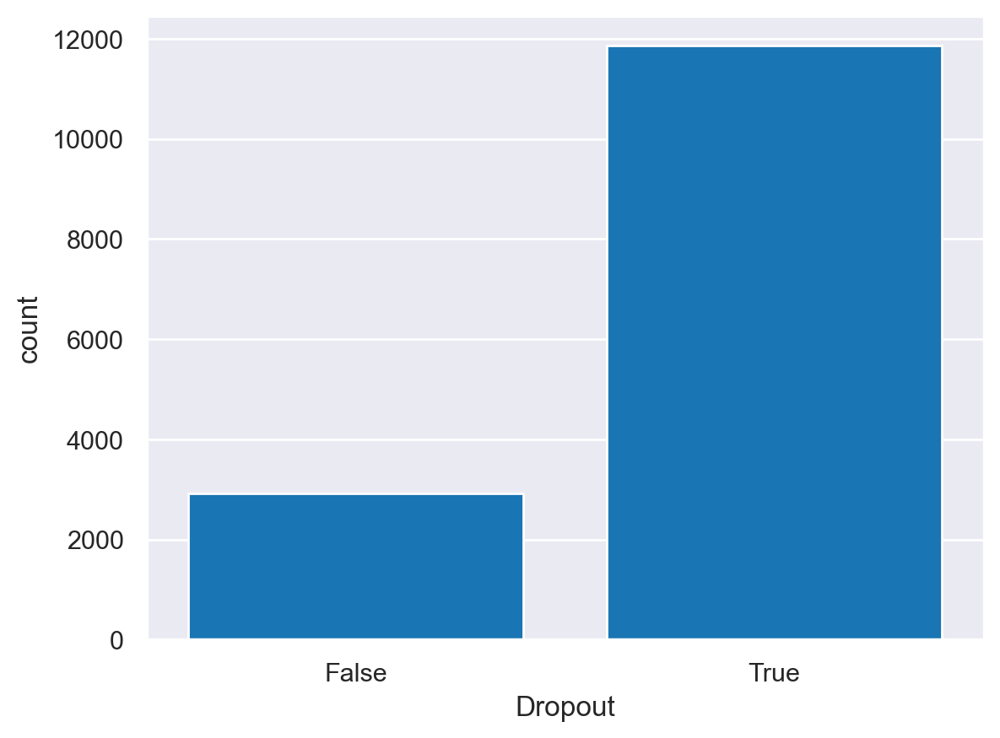

In [64]:
#Count the total dropouts 
sns.countplot(x=df3["Dropout"],color='#007acc')
plt.show()


#There is much more people who dropped out than who dindn't.

C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

Text(0.5, 1.0, 'Age Groups vs Dropout')

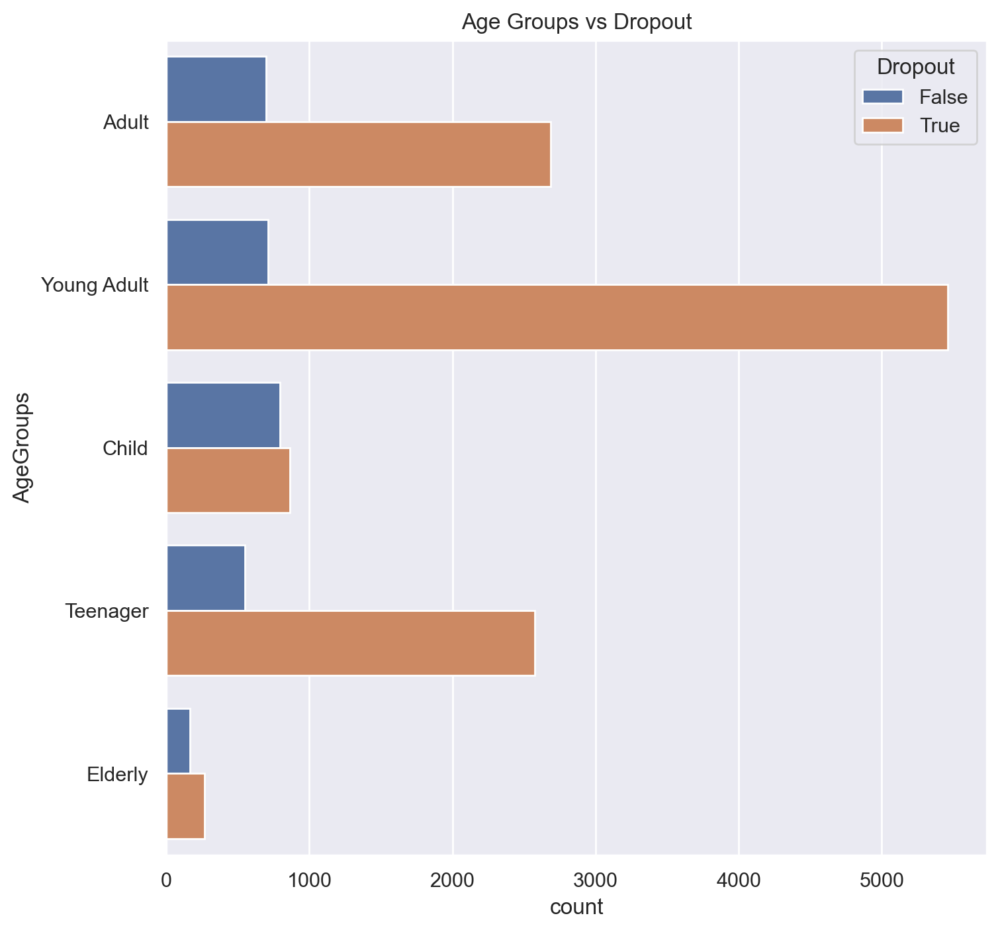

In [65]:
#Age vs Dropout
fig = plt.figure(figsize=(8,8))
sns.countplot(y= df3['AgeGroups'], hue = df3['Dropout']).set_title('Age Groups vs Dropout')


#The ones who dropout the most are between 20 and 26 years old.

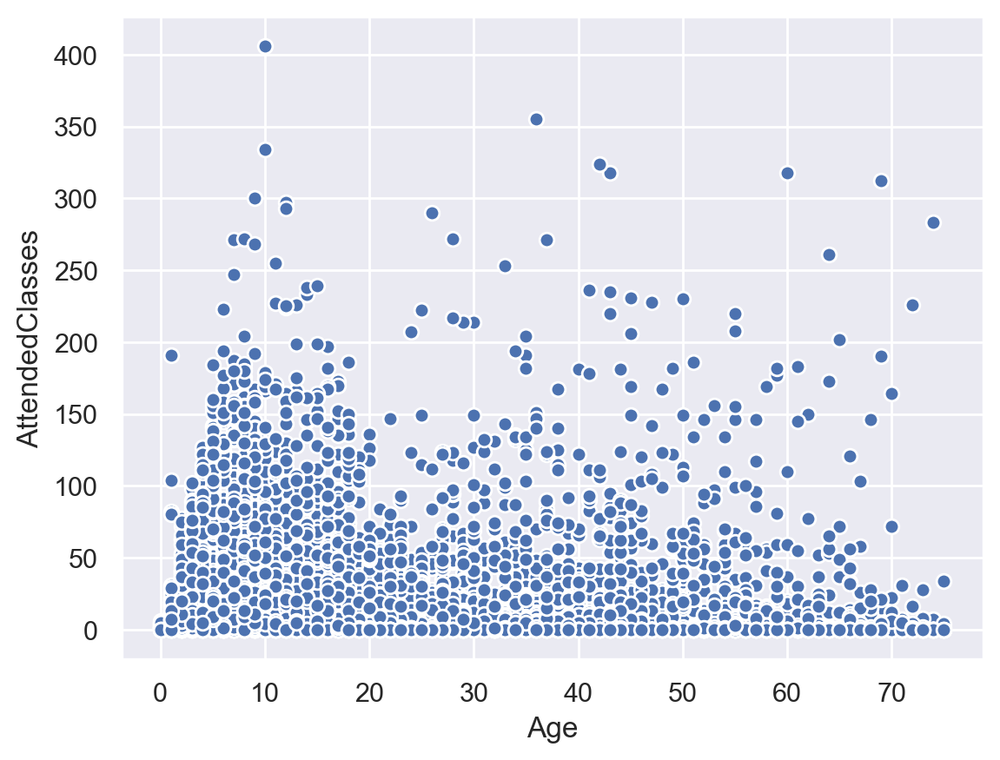

In [66]:
#Single Metric Variable Scatter plot
plt.scatter(df3["Age"], df3["AttendedClasses"], edgecolors="white")
plt.xlabel("Age")
plt.ylabel("AttendedClasses")

plt.show()

#The number of attended classes decreases with the age.
#Many people doesn't attended classes.

In [67]:
#Pairwise Relationship of Numerical Variables
sns.set()

#Setting pairplot
sns.pairplot(df3[metric_features], diag_kind="hist")

#Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

plt.show()

#These variables seem to be the most correlated:
#Age vs Income
#Attended Classes vs LifeTimeValue
#NumberOfFrequencies vs LifeTimeValue

C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

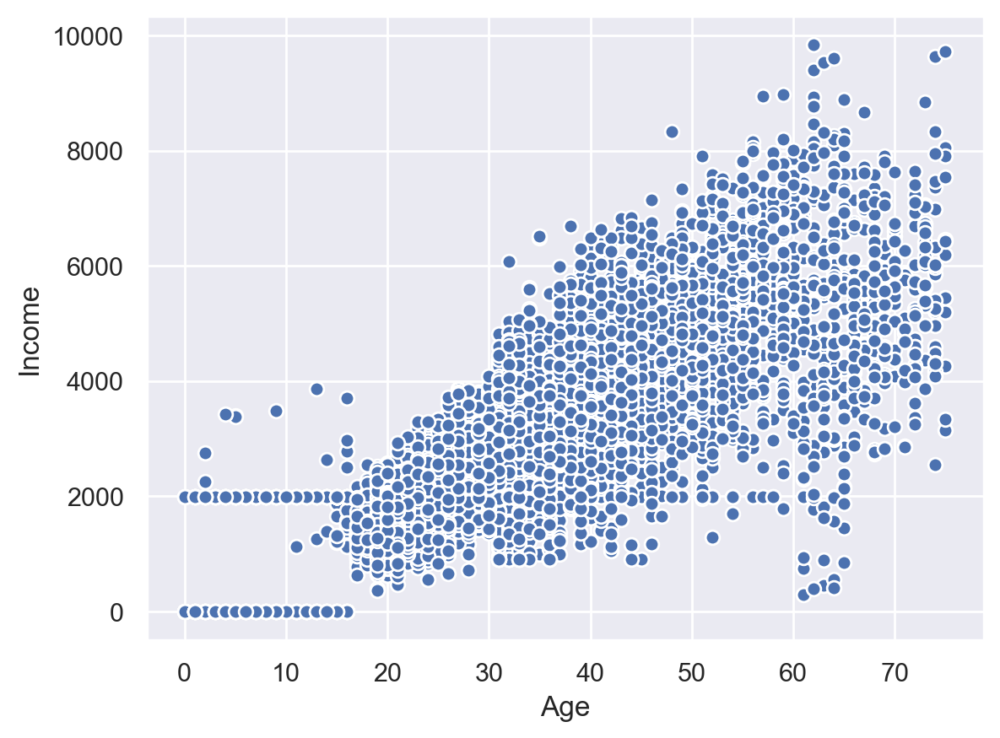

In [68]:
#Single Metric Variable Scatter plot
plt.scatter(df3["Age"], df3["Income"], edgecolors="white")
plt.xlabel("Age")
plt.ylabel("Income")

plt.show()

#The older they are, the higher the income they have.

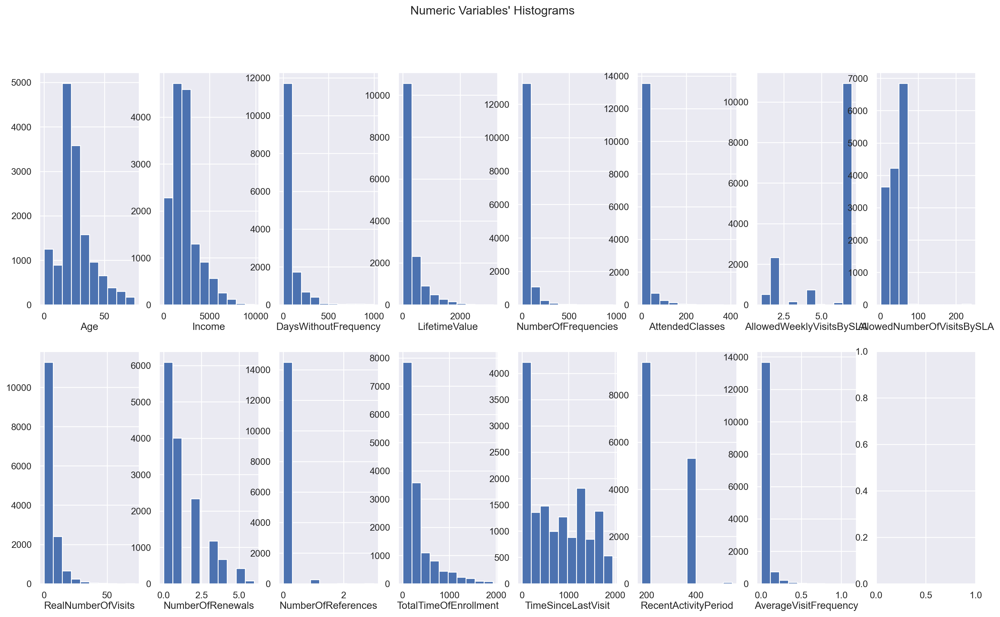

In [69]:
#All Numeric Variables' Histograms in one figure
sns.set()

#Prepare figure. Create individual axes where each histogram will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

#Plot data
#Iterate across axes objects and associate each histogram (hint: use the ax.hist() instead of plt.hist()):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
    ax.hist(df3[feat])
    ax.set_title(feat, y=-0.13)
    
#Layout
title = "Numeric Variables' Histograms"

plt.suptitle(title)

plt.show()

C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

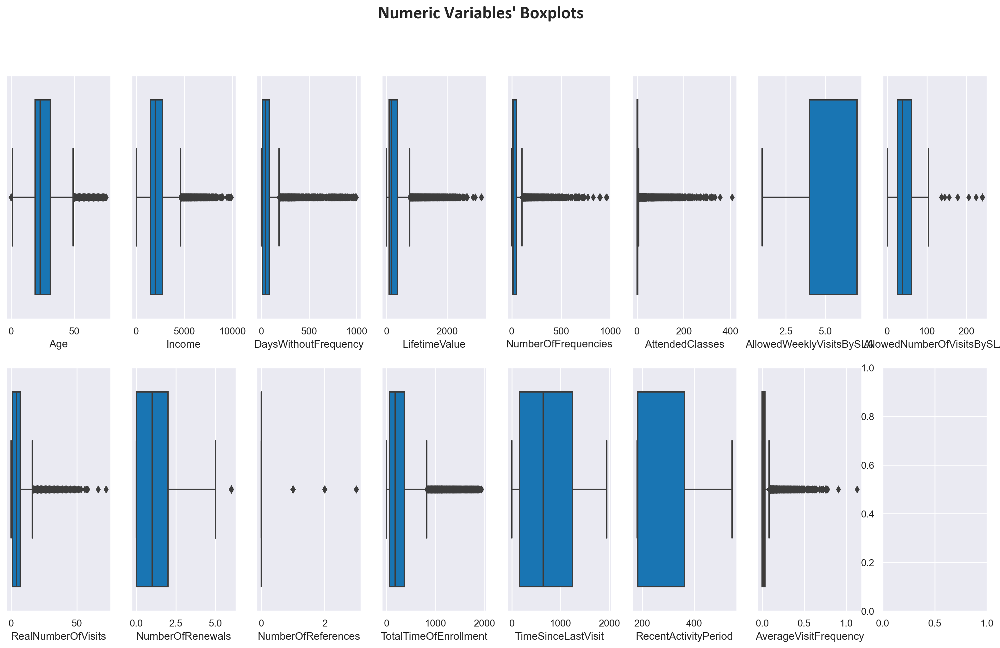

In [70]:
#Check Numeric Variables' Boxplots
sns.set()
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=df3[feat], ax=ax, color='#007acc')

title = "Numeric Variables' Boxplots"
plt.suptitle(title, size=20, weight='bold', family='Calibri')

plt.show()

## 3.8. Data Normalization

In [71]:
df3

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,...,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,AgeGroups,TotalTimeOfEnrollment,TimeSinceLastVisit,RecentActivityPeriod,AverageVisitFrequency
ID,,,,,,,,,,,,,,,,,,,,,
10000,60,Female,5500.0,1,89.35,False,False,False,True,False,...,2,0,False,0,False,Adult,58,1,183,0.034483
10001,29,Female,2630.0,60,479.20,False,False,False,False,False,...,1,2,False,0,True,Young Adult,398,1568,364,0.002513
10002,23,Male,1980.0,7,37.60,False,False,False,True,False,...,6,0,False,0,True,Young Adult,30,889,180,0.200000
10003,9,Male,0.0,22,155.40,False,False,False,False,True,...,3,0,False,0,True,Child,160,283,364,0.018750
10004,35,Male,4320.0,210,373.20,False,False,False,True,False,...,0,3,False,0,True,Adult,778,721,180,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24937,14,Male,0.0,2,1460.45,False,False,True,False,False,...,8,3,False,0,False,Teenager,0,2,183,0.000000
24938,39,Male,1990.0,38,343.85,False,False,False,False,False,...,3,0,False,0,True,Adult,261,1282,181,0.011494
24939,20,Male,1810.0,2,43.60,False,False,False,True,False,...,8,0,False,0,True,Teenager,30,946,180,0.266667


In [72]:
df3_minmax = df3.copy()

In [73]:
#MinMaxScaler to scale the data
scaler = MinMaxScaler()
scaled_feat = scaler.fit_transform(df3_minmax[metric_features])
scaled_feat

array([[8.00000000e-01, 5.58943089e-01, 1.00401606e-03, ...,
        5.13874615e-04, 8.19672131e-03, 3.05418719e-02],
       [3.86666667e-01, 2.67276423e-01, 6.02409639e-02, ...,
        8.05755396e-01, 5.02732240e-01, 2.22541278e-03],
       [3.06666667e-01, 2.01219512e-01, 7.02811245e-03, ...,
        4.56834532e-01, 0.00000000e+00, 1.77142857e-01],
       ...,
       [2.66666667e-01, 1.83943089e-01, 2.00803213e-03, ...,
        4.86125385e-01, 0.00000000e+00, 2.36190476e-01],
       [7.33333333e-01, 4.87804878e-01, 3.01204819e-03, ...,
        1.54162384e-03, 8.19672131e-03, 0.00000000e+00],
       [4.26666667e-01, 3.76016260e-01, 1.40562249e-02, ...,
        8.01644399e-02, 0.00000000e+00, 9.87503063e-03]])

In [74]:
df3_minmax[metric_features] 
df3_minmax[metric_features] = scaled_feat
df3_minmax.head()

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,...,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,AgeGroups,TotalTimeOfEnrollment,TimeSinceLastVisit,RecentActivityPeriod,AverageVisitFrequency
ID,,,,,,,,,,,,,,,,,,,,,
10000,0.800000,Female,0.558943,0.001004,0.028402,False,False,False,True,False,...,0.027778,0.000000,False,0.0,False,Adult,0.029928,0.000514,0.008197,0.030542
10001,0.386667,Female,0.267276,0.060241,0.152328,False,False,False,False,False,...,0.013889,0.333333,False,0.0,True,Young Adult,0.205366,0.805755,0.502732,0.002225
10002,0.306667,Male,0.201220,0.007028,0.011952,False,False,False,True,False,...,0.083333,0.000000,False,0.0,True,Young Adult,0.015480,0.456835,0.000000,0.177143
10003,0.120000,Male,0.000000,0.022088,0.049398,False,False,False,False,True,...,0.041667,0.000000,False,0.0,True,Child,0.082559,0.145427,0.502732,0.016607
10004,0.466667,Male,0.439024,0.210843,0.118632,False,False,False,True,False,...,0.000000,0.500000,False,0.0,True,Adult,0.401445,0.370504,0.000000,0.000000


In [75]:
# Checking max and min of minmaxed variables
df3_minmax[metric_features].describe().round(4)

,Age,Income,DaysWithoutFrequency,LifetimeValue,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,NumberOfReferences,TotalTimeOfEnrollment,TimeSinceLastVisit,RecentActivityPeriod,AverageVisitFrequency
count,14773.0000,14773.0000,14773.0000,14773.0000,14773.0000,14773.0000,14773.0000,14773.0000,14773.0000,14773.0000,14773.0000,14773.0000,14773.0000,14773.0000,14773.0000
mean,0.3437,0.2241,0.0738,0.0957,0.0406,0.0250,0.8005,0.1715,0.0737,0.1973,0.0074,0.1503,0.3770,0.1884,0.0289
std,0.1833,0.1544,0.1085,0.1133,0.0673,0.0704,0.3489,0.0881,0.0869,0.2274,0.0555,0.1802,0.3032,0.2446,0.0593
min,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
25%,0.2533,0.1514,0.0131,0.0266,0.0062,0.0000,0.5000,0.1050,0.0139,0.0000,0.0000,0.0294,0.0791,0.0027,0.0000
50%,0.3067,0.2022,0.0412,0.0527,0.0177,0.0000,1.0000,0.1605,0.0556,0.1667,0.0000,0.0898,0.3304,0.0082,0.0076
75%,0.4133,0.2774,0.0823,0.1126,0.0458,0.0074,1.0000,0.2523,0.0972,0.3333,0.0000,0.1868,0.6418,0.5027,0.0292
max,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


In [76]:
#Compare the two methods and choose one
df3_scaled = df3_minmax.copy()

Since our data isn't normally distributed (the majority of the features), and the variables have different units and scales, we decided to use the MinMaxScaler.

## 3.9. Level Encoding

In [77]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

for feature in non_metric_features:
    df3_scaled[feature] = label_encoder.fit_transform(df3_scaled[feature])

df3_scaled[non_metric_features]

,Gender,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,RacketActivities,CombatActivities,SpecialActivities,OtherActivities,HasReferences,Dropout,AgeGroups
ID,,,,,,,,,,,,,
10000,0,0,0,0,1,0,0,0,0,0,0,0,0
10001,0,0,0,0,0,0,0,0,1,0,0,1,4
10002,1,0,0,0,1,0,0,0,0,0,0,1,4
10003,1,0,0,0,0,1,0,0,0,0,0,1,1
10004,1,0,0,0,1,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
24937,1,0,0,1,0,0,0,0,0,0,0,0,3
24938,1,0,0,0,0,0,0,1,0,0,0,1,0
24939,1,0,0,0,1,0,0,0,0,0,0,1,3


In [78]:
df3_scaled.head()

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,...,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,AgeGroups,TotalTimeOfEnrollment,TimeSinceLastVisit,RecentActivityPeriod,AverageVisitFrequency
ID,,,,,,,,,,,,,,,,,,,,,
10000,0.800000,0,0.558943,0.001004,0.028402,0,0,0,1,0,...,0.027778,0.000000,0,0.0,0,0,0.029928,0.000514,0.008197,0.030542
10001,0.386667,0,0.267276,0.060241,0.152328,0,0,0,0,0,...,0.013889,0.333333,0,0.0,1,4,0.205366,0.805755,0.502732,0.002225
10002,0.306667,1,0.201220,0.007028,0.011952,0,0,0,1,0,...,0.083333,0.000000,0,0.0,1,4,0.015480,0.456835,0.000000,0.177143
10003,0.120000,1,0.000000,0.022088,0.049398,0,0,0,0,1,...,0.041667,0.000000,0,0.0,1,1,0.082559,0.145427,0.502732,0.016607
10004,0.466667,1,0.439024,0.210843,0.118632,0,0,0,1,0,...,0.000000,0.500000,0,0.0,1,0,0.401445,0.370504,0.000000,0.000000


## 3.10. Feature selection

### 3.10.1. Filter methods

#### Correlation

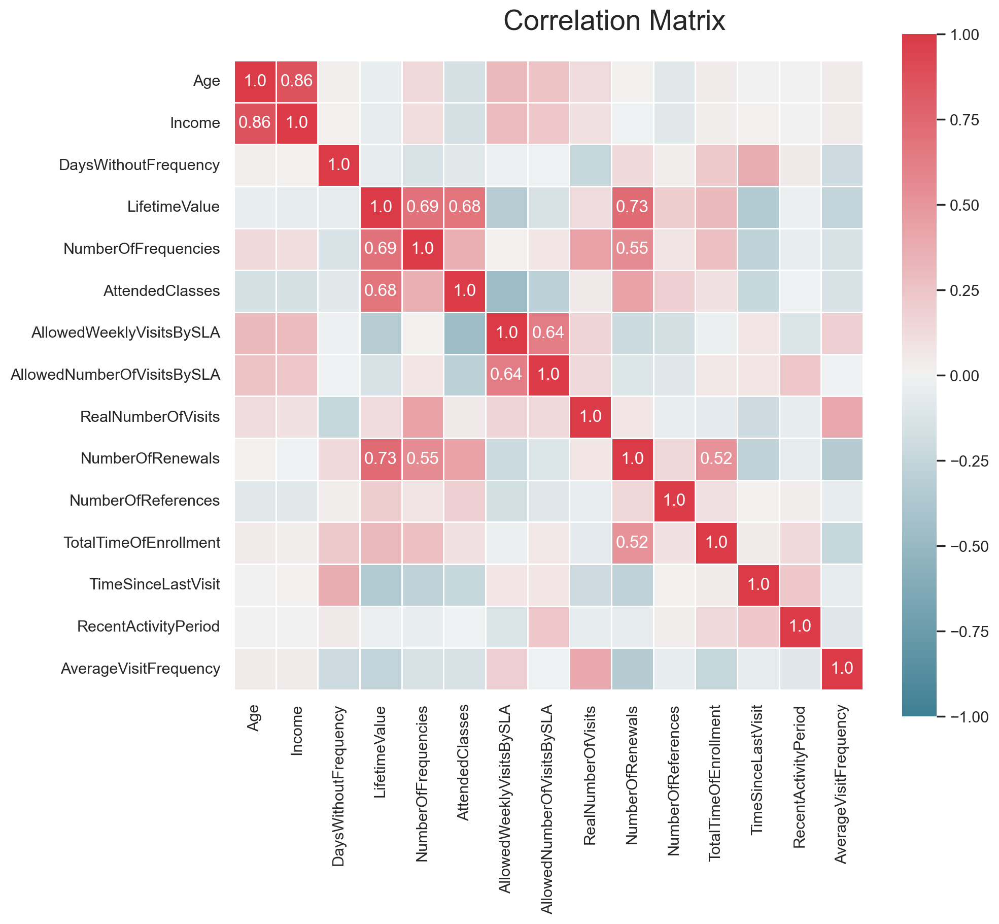

In [79]:
#Metric Variables' Correlation Matrix

# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(df3_scaled[metric_features].corr(method="pearson"), decimals=2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

#plt.savefig(os.path.join('..', 'figures', 'exp_analysis', 'correlation_matrix.png'), dpi=200)

plt.show()

In [80]:
#SAVE EVERYTHING FROM THE PREPROCESSING SO WE DONT HAVE TO GO THRU THE PROCESS AGAIN
#df3_scaled.to_csv(os.path.join("..", "Projeto DM", "DM_project_preprocessed.csv"), index=False)

### DBSCAN

In [81]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=1.9, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df3_scaled[metric_features])

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 1


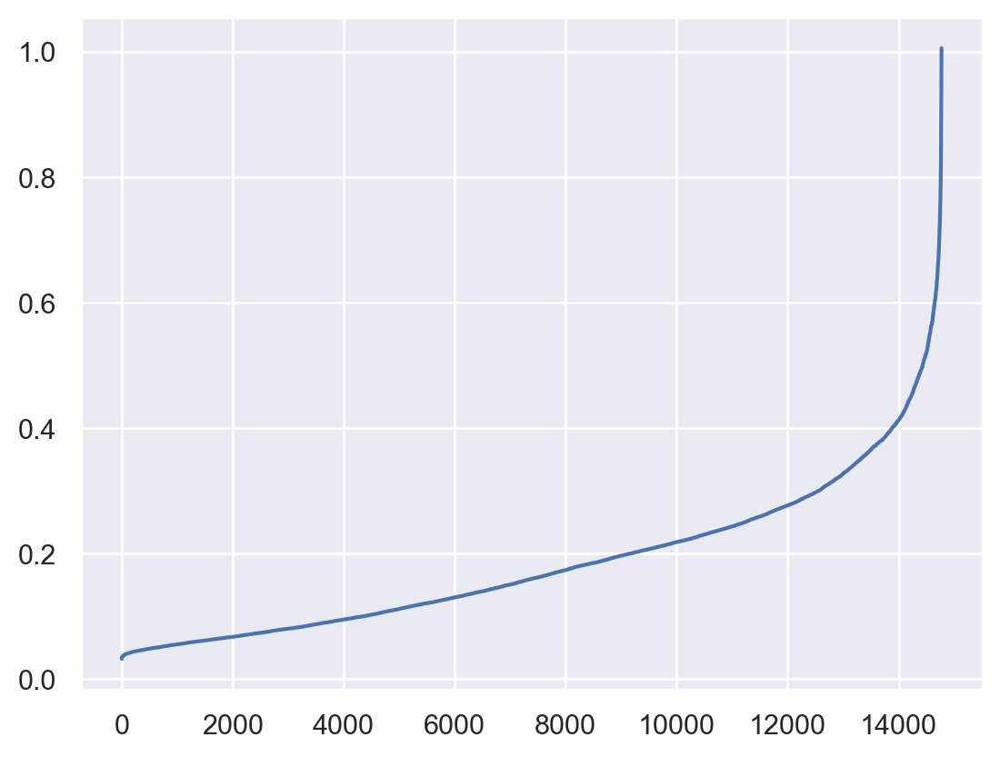

In [82]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(df3_scaled[metric_features])
distances, _ = neigh.kneighbors(df3_scaled[metric_features])
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [83]:
# Concatenating the labels to df
df_concat = pd.concat([df3_scaled[metric_features], pd.Series(dbscan_labels, index=df3_scaled.index, name="dbscan_labels")], axis=1)
df_concat.head()

,Age,Income,DaysWithoutFrequency,LifetimeValue,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,NumberOfReferences,TotalTimeOfEnrollment,TimeSinceLastVisit,RecentActivityPeriod,AverageVisitFrequency,dbscan_labels
ID,,,,,,,,,,,,,,,,
10000,0.800000,0.558943,0.001004,0.028402,0.008333,0.017241,1.000000,0.023886,0.027778,0.000000,0.0,0.029928,0.000514,0.008197,0.030542,0
10001,0.386667,0.267276,0.060241,0.152328,0.022917,0.002463,0.166667,0.070405,0.013889,0.333333,0.0,0.205366,0.805755,0.502732,0.002225,0
10002,0.306667,0.201220,0.007028,0.011952,0.005208,0.000000,1.000000,0.123063,0.083333,0.000000,0.0,0.015480,0.456835,0.000000,0.177143,0
10003,0.120000,0.000000,0.022088,0.049398,0.019792,0.004926,0.166667,0.071658,0.041667,0.000000,0.0,0.082559,0.145427,0.502732,0.016607,0
10004,0.466667,0.439024,0.210843,0.118632,0.041667,0.000000,1.000000,0.252265,0.000000,0.500000,0.0,0.401445,0.370504,0.000000,0.000000,0


In [84]:
# Detecting noise (potential outliers)
df_concat.loc[df_concat['dbscan_labels'] == -1]

,Age,Income,DaysWithoutFrequency,LifetimeValue,NumberOfFrequencies,AttendedClasses,AllowedWeeklyVisitsBySLA,AllowedNumberOfVisitsBySLA,RealNumberOfVisits,NumberOfRenewals,NumberOfReferences,TotalTimeOfEnrollment,TimeSinceLastVisit,RecentActivityPeriod,AverageVisitFrequency,dbscan_labels
ID,,,,,,,,,,,,,,,,


In [85]:
# Based on the hyperparameters found in the previous class
dbscan = DBSCAN(eps=1.9, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(df3_scaled[metric_features])
Counter(dbscan_labels)

Counter({0: 14773})

There is no noise.

# 4. Clustering

## 4.1. K-Means Clustering

#### For metric features:

In [86]:
kmclust = KMeans(n_clusters=8,  #default, see scikit learn
                 init='random',      #in a random way
                 n_init=10,       #pick 10 possible sets of 8 centroids
                 random_state=1)   #whatever the number we want, the random 8 points, will always be the same random 8 points - pseudo random
                                       #will be a different set of 8, if we don't use the random  state

In [87]:
# the fit method, only on metric
kmclust.fit(df3_scaled[metric_features])

KMeans(init='random', n_init=10, random_state=1)

In [88]:
# the transform method
pd.DataFrame(kmclust.transform(df3_scaled[metric_features]))

,0,1,2,3,4,5,6,7
0,1.286737,1.148532,0.651263,0.978291,0.938763,1.363152,0.928125,0.373414
1,0.319775,0.907186,1.237530,1.151410,0.944510,0.978562,1.016289,1.222489
2,0.983841,0.926185,0.386932,0.881299,0.572961,1.221782,0.339728,0.700954
3,0.571345,0.510141,1.017929,1.223708,0.987507,0.895553,1.167576,1.229206
4,1.088624,1.082562,0.692001,0.386919,0.774845,1.059232,0.654209,0.601550
...,...,...,...,...,...,...,...,...
14768,1.004539,0.606155,0.849637,0.899645,1.123473,0.446698,1.106452,1.013963
14769,0.981050,1.067347,0.608460,0.863953,0.567120,1.289404,0.257613,0.707189
14770,0.994115,0.943339,0.437196,0.910404,0.596746,1.236931,0.361339,0.759596
14771,1.033813,0.838678,1.002481,1.062080,1.212673,0.829528,1.203376,0.779814


##### Improve the initialization step

In [89]:
# Better initialization method and provide more n_init
kmclust = KMeans(n_clusters=8, 
                 init='k-means++',  
                 n_init=15, 
                 random_state=1)

kmclust.fit(df3_scaled[metric_features])

#init='k-means++' initializes the centroids to be (generally) distant from each other, leading to probably better results than random initialization. n_init=K allows to initialize KMeans K times and pick the best clustering in terms of Inertia

KMeans(n_init=15, random_state=1)

In [90]:
kmclust.predict(df3_scaled[metric_features])

#row 0 is cluster nr 4, row 1 is cluster nr 2,...

array([4, 2, 0, ..., 0, 4, 6])

##### Defining the number of clusters

In [91]:
range_clusters = range(1, 11)

inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, 
                     init='k-means++', 
                     n_init=15, 
                     random_state=1)
    kmclust.fit(df3_scaled[metric_features])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

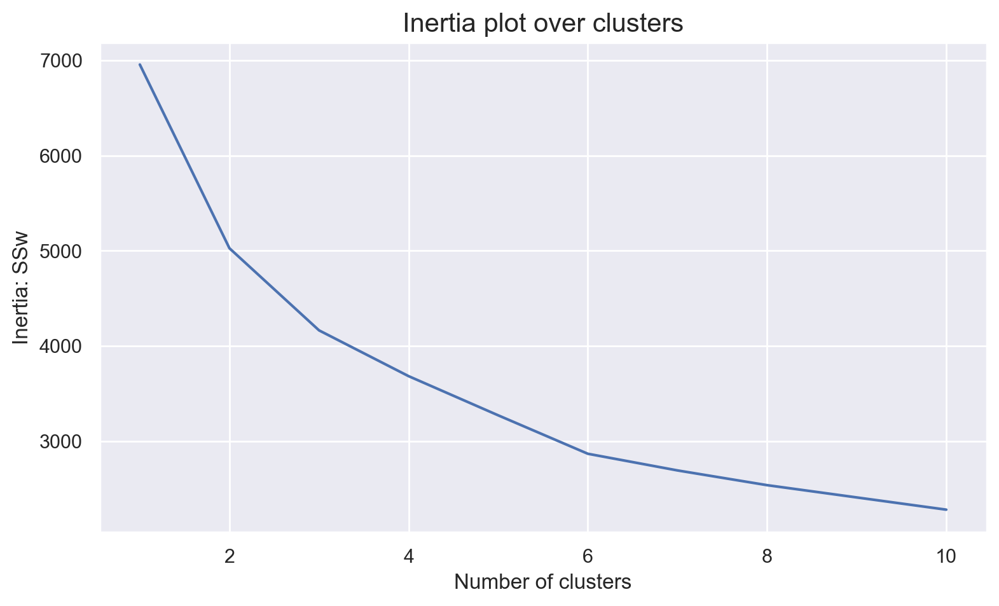

In [92]:
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(range_clusters, inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

#the lower the inertia the better, the smallest SSw of the centroids - but is too much clusters 
#identify the elbow - 6

For n_clusters = 2, the average silhouette_score is : 0.34323235257961193
For n_clusters = 3, the average silhouette_score is : 0.2353061979563211
For n_clusters = 4, the average silhouette_score is : 0.24224010098484844
For n_clusters = 5, the average silhouette_score is : 0.2630277175590708
For n_clusters = 6, the average silhouette_score is : 0.27794109178569193
For n_clusters = 7, the average silhouette_score is : 0.27715322990886565
For n_clusters = 8, the average silhouette_score is : 0.27434560758613585
For n_clusters = 9, the average silhouette_score is : 0.2765891057664089
For n_clusters = 10, the average silhouette_score is : 0.2734387347767554


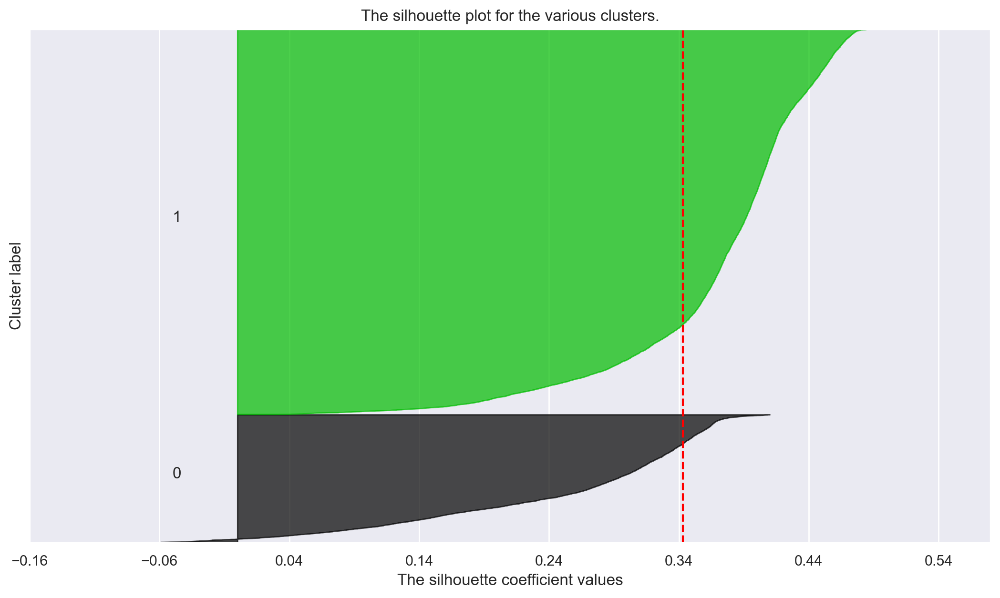

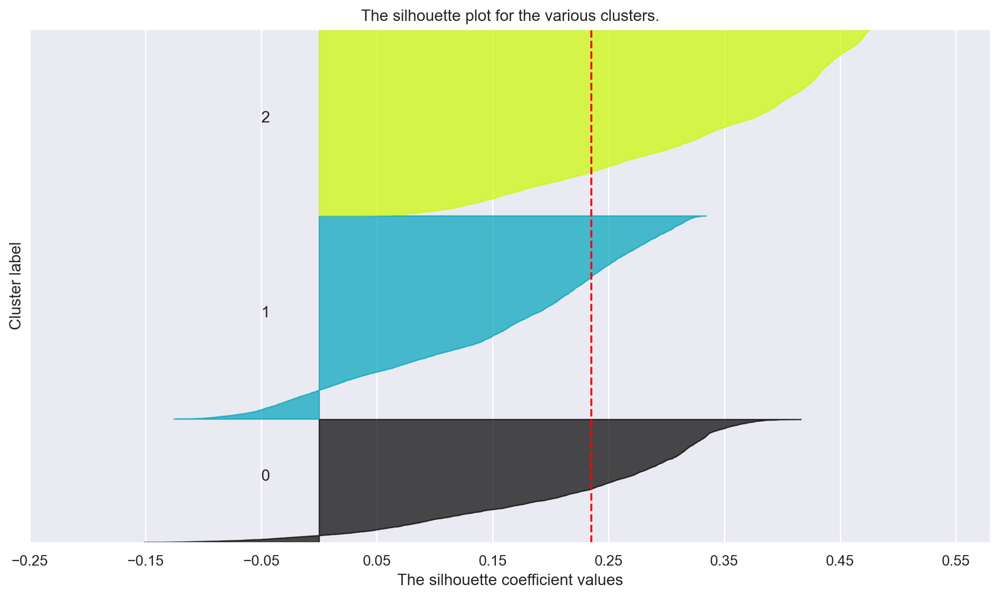

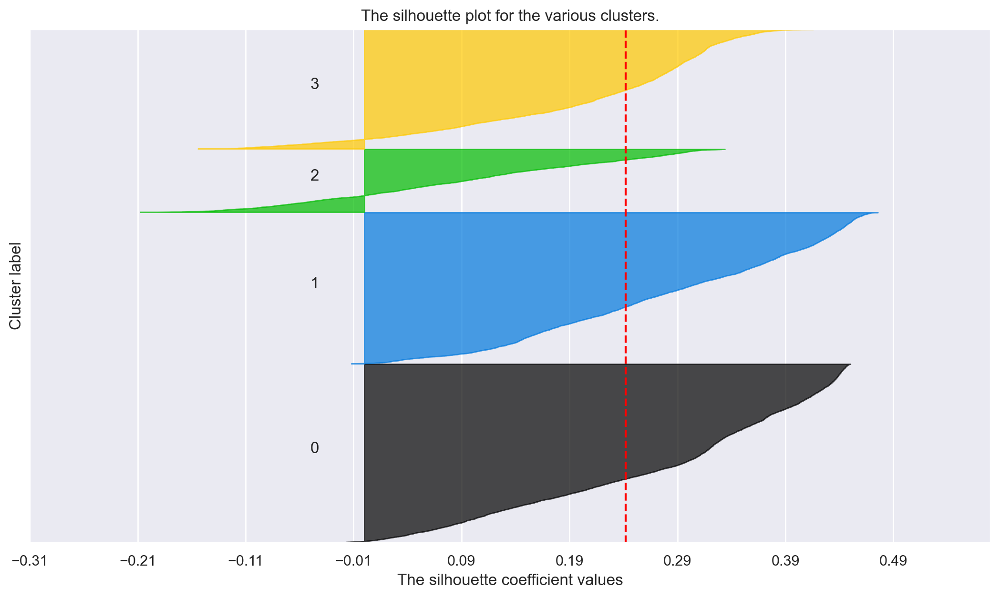

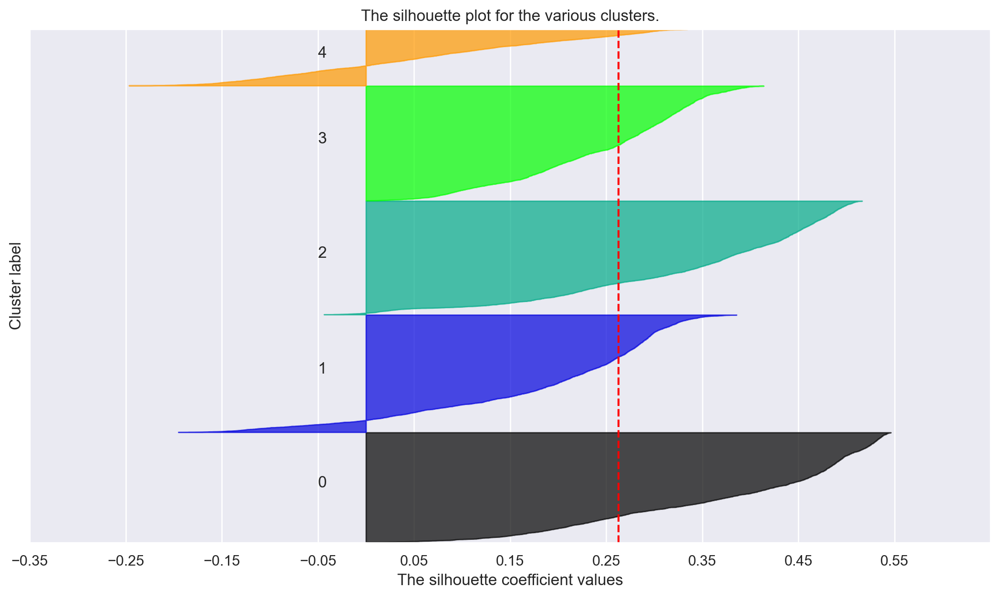

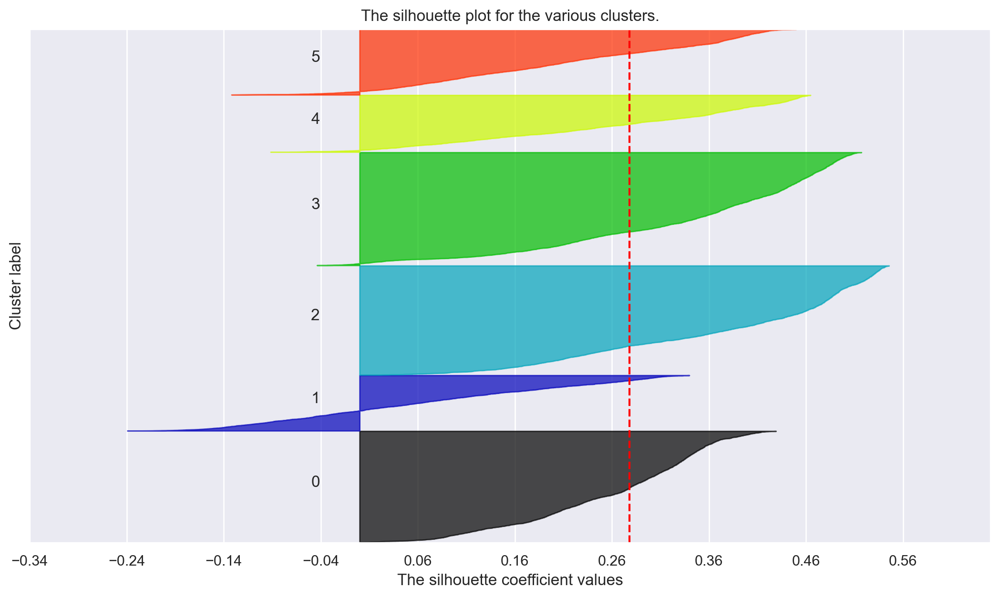

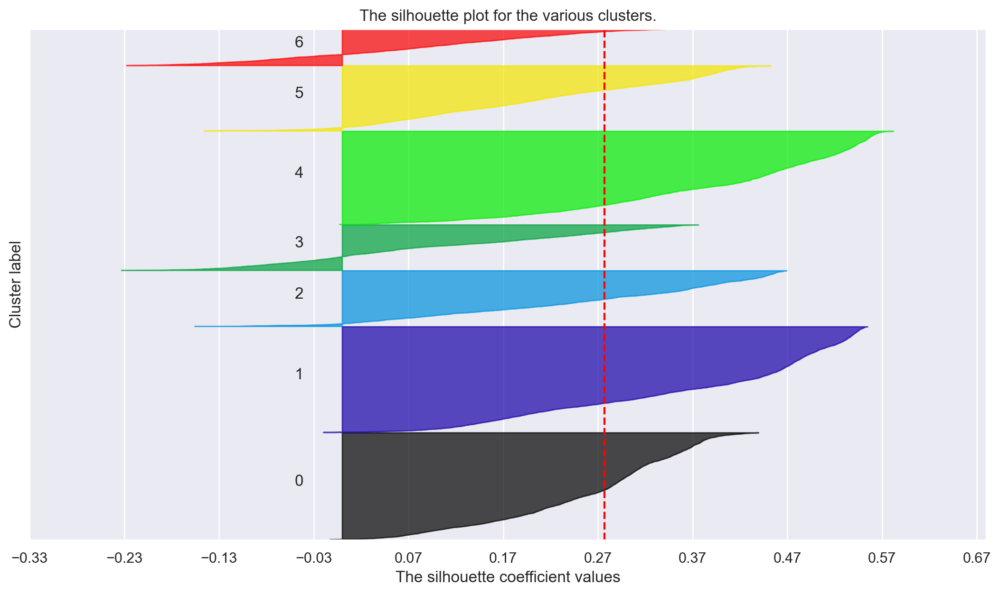

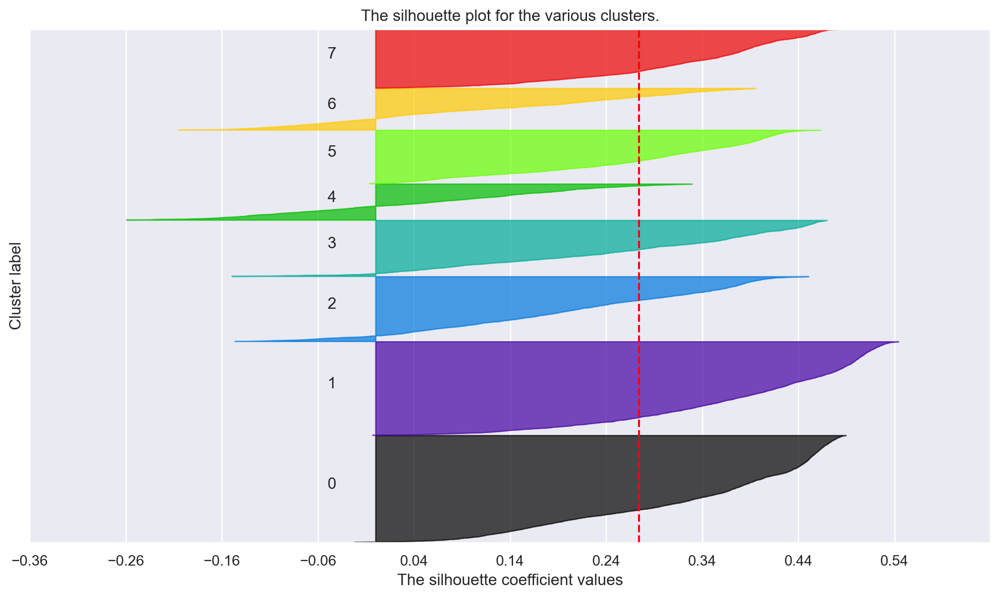

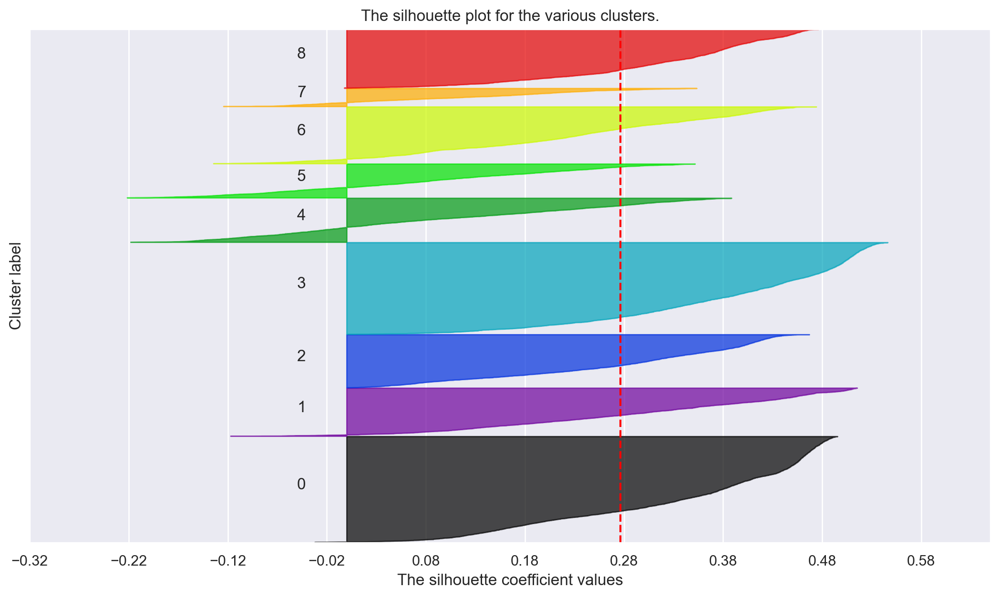

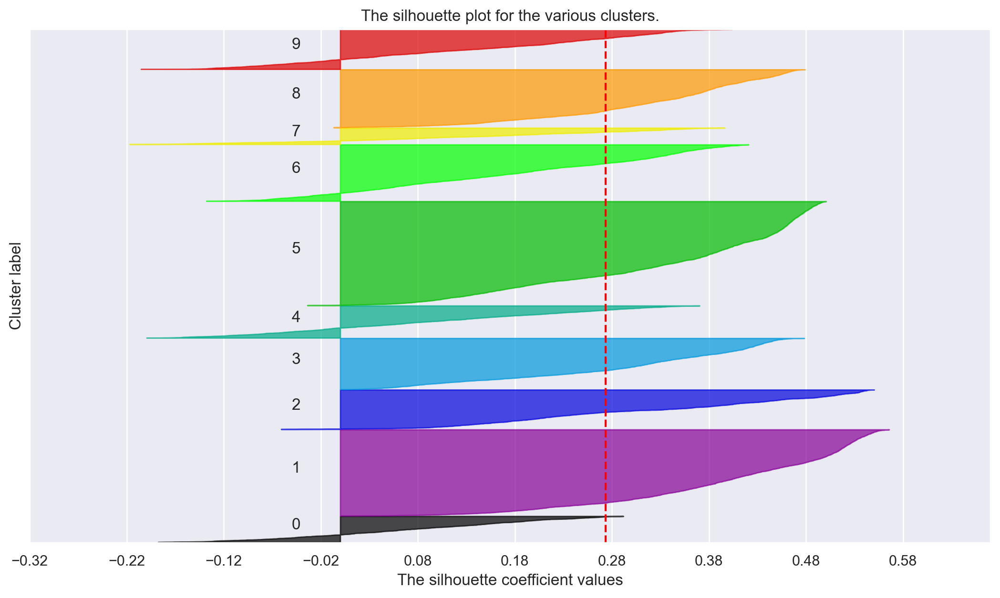

In [93]:
# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1 - WE NEED AT LEAST 2 CLUSTERS
    if nclus == 1:  
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df3_scaled[metric_features])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df3_scaled[metric_features], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df3_scaled[metric_features], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df3_scaled[metric_features]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

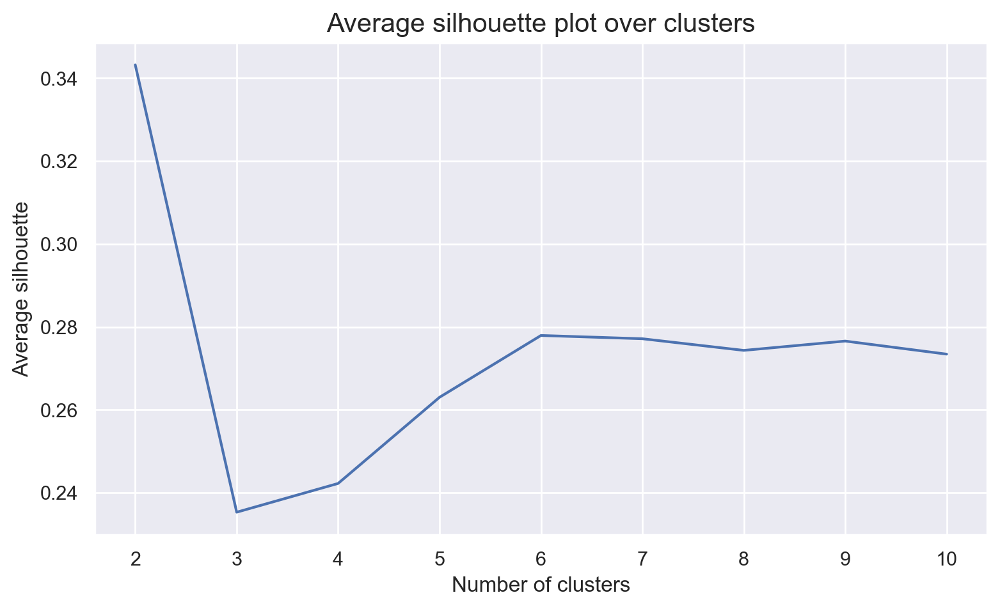

In [94]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(range_clusters[1:], ## Plot X-axis; Why range_clusters[1:] ? Remember we skipped k=1 in the cell above
         avg_silhouette)     ## Plot Y-axis

plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

##### Apart from the 2 cluster option, the 6 clusters is the one with the highest inertia, so we will continue with this number of clusters. It was also one of the best options according to the silhouette plots above.

##### Final K-Means clustering solution

In [95]:
# final cluster solution
number_clusters = 6
kmclust = KMeans(n_clusters=number_clusters, 
                 init='k-means++', 
                 n_init=15, 
                 random_state=1)
kmeans_labels = kmclust.fit_predict(df3_scaled[metric_features])
kmeans_labels

array([3, 5, 2, ..., 2, 4, 1])

In [96]:
# Characterizing the final clusters
df3_concat_kmean = pd.concat((df3_scaled, pd.Series(kmeans_labels, name='labels', index=df3_scaled.index)), axis=1)
df3_concat_kmean.groupby('labels').mean()

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,...,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,AgeGroups,TotalTimeOfEnrollment,TimeSinceLastVisit,RecentActivityPeriod,AverageVisitFrequency
labels,,,,,,,,,,,,,,,,,,,,,
0,0.367074,0.409657,0.243421,0.071997,0.056387,0.047040,0.008411,0.181931,0.665421,0.017445,...,0.073801,0.096729,0.005607,0.001661,0.982866,2.838941,0.127351,0.494830,0.507395,0.029657
1,0.456454,0.491261,0.308257,0.079235,0.220084,0.179775,0.011860,0.294007,0.710986,0.056180,...,0.105250,0.580732,0.022472,0.007699,0.757803,2.194132,0.429326,0.168216,0.161020,0.004169
2,0.348697,0.357505,0.230070,0.107183,0.039991,0.040532,0.005066,0.077897,0.854655,0.011083,...,0.065460,0.111885,0.006333,0.001794,0.998100,3.014250,0.123465,0.689975,0.003312,0.035246
3,0.384146,0.378064,0.255825,0.037221,0.052649,0.034314,0.008885,0.184130,0.703431,0.027574,...,0.091478,0.102124,0.001532,0.000613,0.569853,2.515625,0.055918,0.108584,0.009951,0.056200
4,0.165361,0.447080,0.085253,0.040182,0.237430,0.005474,0.009124,0.834550,0.039538,0.158759,...,0.067079,0.401460,0.059611,0.022709,0.361922,1.548662,0.123618,0.067895,0.055358,0.004819
5,0.285629,0.393140,0.175889,0.108708,0.101287,0.007388,0.001583,0.582058,0.093931,0.150923,...,0.036030,0.172559,0.059631,0.024274,0.992084,1.946174,0.183685,0.562823,0.402063,0.012144


In [130]:
df3_concat_kmean

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,...,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,AgeGroups,TotalTimeOfEnrollment,TimeSinceLastVisit,RecentActivityPeriod,AverageVisitFrequency,labels
ID,,,,,,,,,,,,,,,,,,,,,
10000,0.800000,0,0.558943,0.001004,0.028402,0,0,0,1,0,...,0.000000,0,0.0,0,0,0.029928,0.000514,0.008197,0.030542,3
10001,0.386667,0,0.267276,0.060241,0.152328,0,0,0,0,0,...,0.333333,0,0.0,1,4,0.205366,0.805755,0.502732,0.002225,5
10002,0.306667,1,0.201220,0.007028,0.011952,0,0,0,1,0,...,0.000000,0,0.0,1,4,0.015480,0.456835,0.000000,0.177143,2
10003,0.120000,1,0.000000,0.022088,0.049398,0,0,0,0,1,...,0.000000,0,0.0,1,1,0.082559,0.145427,0.502732,0.016607,5
10004,0.466667,1,0.439024,0.210843,0.118632,0,0,0,1,0,...,0.500000,0,0.0,1,0,0.401445,0.370504,0.000000,0.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24937,0.186667,1,0.000000,0.002008,0.464247,0,0,1,0,0,...,0.500000,0,0.0,0,3,0.000000,0.001028,0.008197,0.000000,4
24938,0.520000,1,0.202236,0.038153,0.109303,0,0,0,0,0,...,0.000000,0,0.0,1,0,0.134675,0.658787,0.002732,0.010181,2
24939,0.266667,1,0.183943,0.002008,0.013860,0,0,0,1,0,...,0.000000,0,0.0,1,3,0.015480,0.486125,0.000000,0.236190,2


In [97]:
cluster_means = df3_concat_kmean.groupby('labels').mean()[metric_features].T
cluster_means.style.format(precision=2).background_gradient(axis=1)

labels,0,1,2,3,4,5
Age,0.37,0.46,0.35,0.38,0.17,0.29
Income,0.24,0.31,0.23,0.26,0.09,0.18
DaysWithoutFrequency,0.07,0.08,0.11,0.04,0.04,0.11
LifetimeValue,0.06,0.22,0.04,0.05,0.24,0.10
NumberOfFrequencies,0.03,0.13,0.02,0.03,0.06,0.02
AttendedClasses,0.00,0.03,0.00,0.00,0.13,0.05
AllowedWeeklyVisitsBySLA,1.00,0.97,0.99,0.99,0.22,0.19
AllowedNumberOfVisitsBySLA,0.25,0.21,0.17,0.18,0.07,0.08
RealNumberOfVisits,0.07,0.11,0.07,0.09,0.07,0.04
NumberOfRenewals,0.10,0.58,0.11,0.10,0.40,0.17


##### Profiling

In [131]:
def cluster_profiles(df3_concat_kmean, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df3_concat_kmean.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


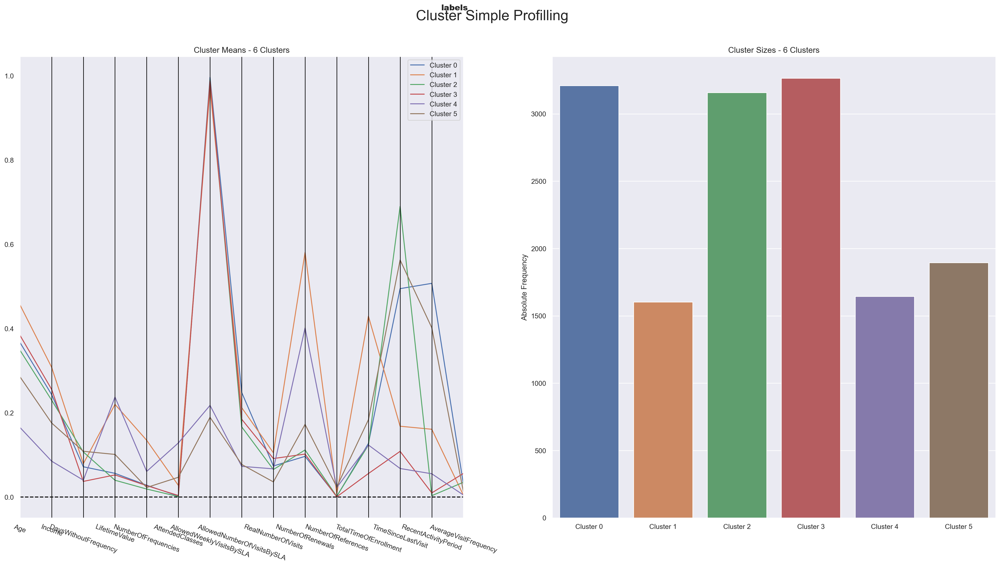

In [133]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    df3_concat_kmean = df3_concat_kmean[metric_features + ['labels']], 
    label_columns = ['labels'], 
    figsize = (28, 13), 
    compar_titles = ["labels"]
)

## 4.2. K-Mode Clustering

#### For categorical features:

##### Test with the 3 possible values for init: "Huang", "Cao" and "random"

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 32360.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 32360.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 32360.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 32360.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 32360.0
Best run was number 1
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 150, cost: 23678.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 2285, cost: 23678.0
Run 2, iteration: 2/100, moves: 875, cost: 23678.0
Init: initializing 

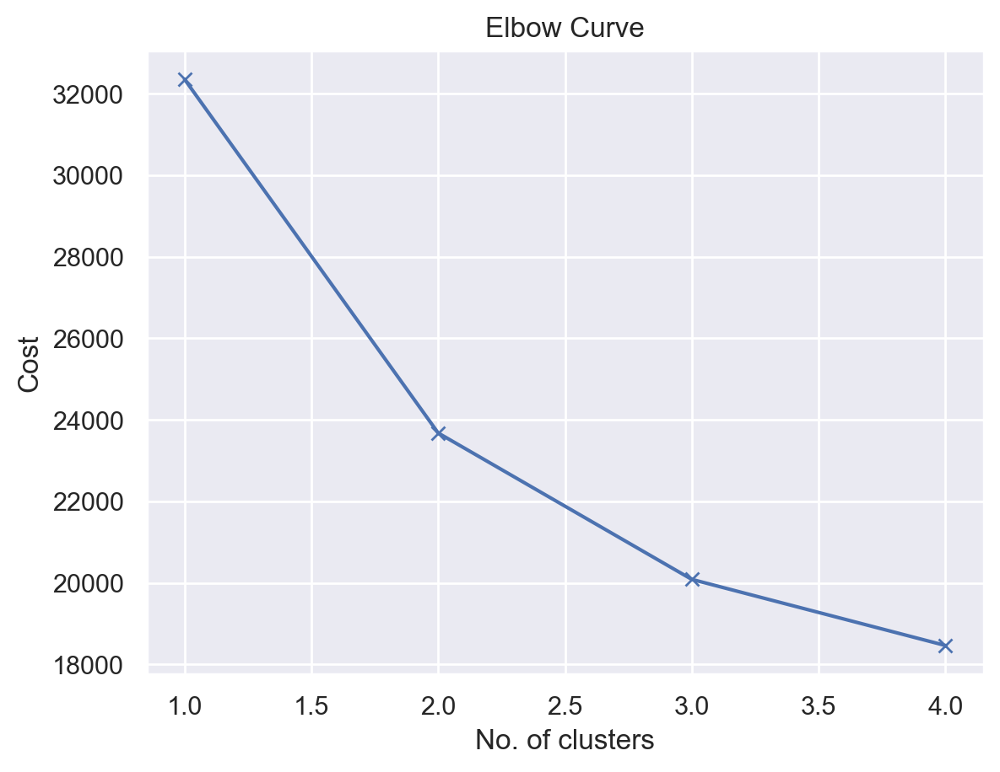

In [98]:
#HUANG

# Elbow curve to find optimal K 
cost = [] 
K = range(1,5) 

for k in list(K): 
    kmode_huang = KModes(n_clusters=k, 
                   init = "Huang",
                   n_init = 5, 
                   verbose=1) 
    
    kmode_huang.fit_predict(df3_scaled[non_metric_features]) 
    cost.append(kmode_huang.cost_) 

# Cost plot
plt.plot(K, cost, 'x-') 
plt.xlabel('No. of clusters') 
plt.ylabel('Cost') 
plt.title('Elbow Curve') 
plt.show()

In [99]:
silhouette_huang = silhouette_score(df3_scaled[non_metric_features], kmode_huang.labels_)
silhouette_huang 

0.22512119824448057

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 32360.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 0, cost: 32360.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 3, iteration: 1/100, moves: 0, cost: 32360.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 4, iteration: 1/100, moves: 0, cost: 32360.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 5, iteration: 1/100, moves: 0, cost: 32360.0
Best run was number 1
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 24767.0
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 2, iteration: 1/100, moves: 2724, cost: 23476.0
Init: initializing centroids
Init: initializing clusters
Starting iterat

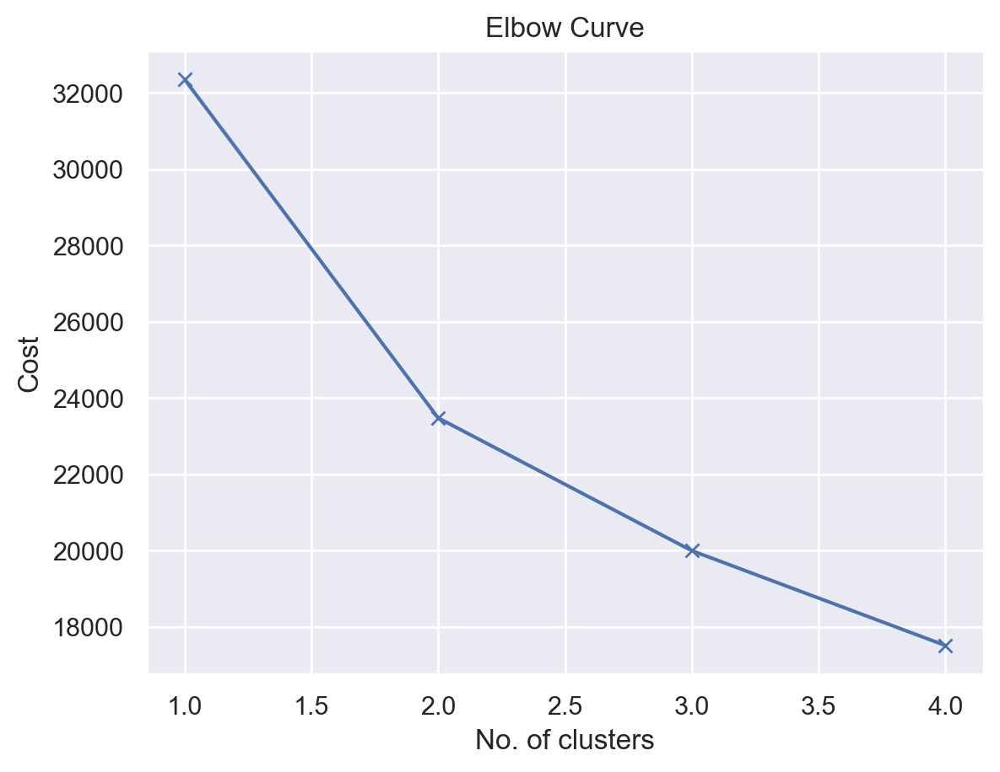

In [100]:
#RANDOM

# Elbow curve to find optimal K 
cost = [] 
K = range(1,5) 

for k in list(K): 
    kmode_random = KModes(n_clusters=k, 
                   init = "random",
                   n_init = 5, 
                   verbose=1) 
    
    kmode_random.fit_predict(df3_scaled[non_metric_features]) 
    cost.append(kmode_random.cost_) 

# Cost plot
plt.plot(K, cost, 'x-') 
plt.xlabel('No. of clusters') 
plt.ylabel('Cost') 
plt.title('Elbow Curve') 
plt.show()

In [101]:
silhouette_random = silhouette_score(df3_scaled[non_metric_features], kmode_random.labels_)
silhouette_random 

0.07681533789811067

Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 32360.0
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 2017, cost: 23957.0
Run 1, iteration: 2/100, moves: 1396, cost: 23476.0
Run 1, iteration: 3/100, moves: 0, cost: 23476.0
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 2424, cost: 22193.0
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 2004, cost: 20597.0


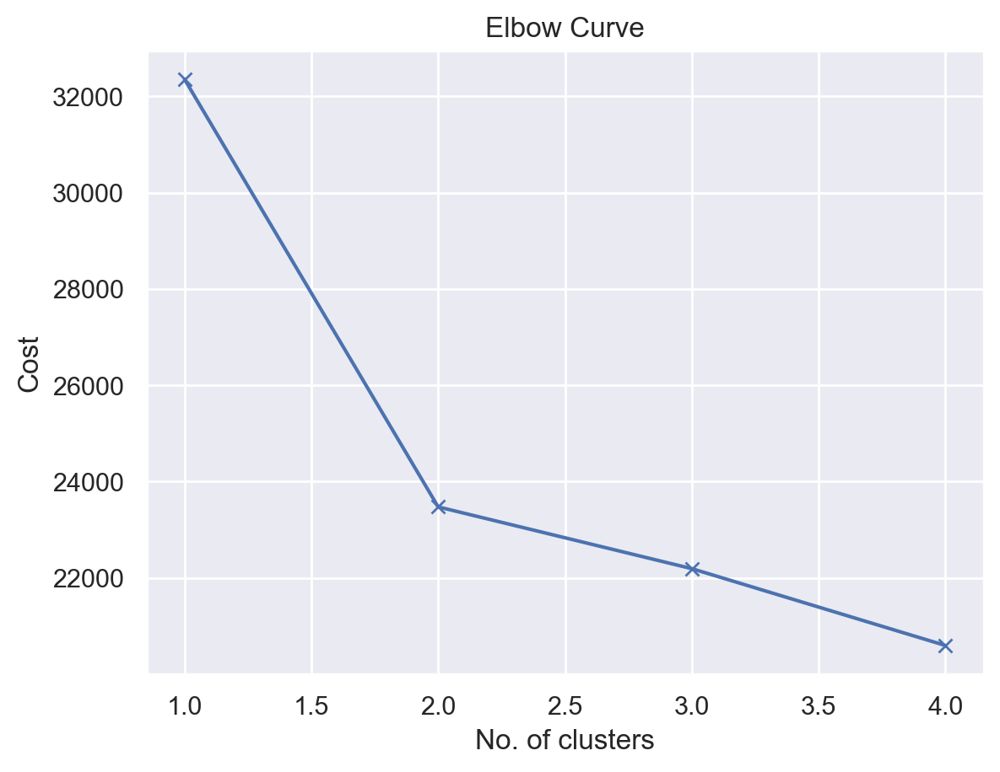

In [102]:
#CAO 

# Elbow curve to find optimal K 
cost = [] 
K = range(1,5) 

for k in list(K): 
    kmode_cao = KModes(n_clusters=k, 
                   init = "Cao",
                   n_init = 5, 
                   verbose=1) 
    
    kmode_cao.fit_predict(df3_scaled[non_metric_features]) 
    cost.append(kmode_cao.cost_) 

# Cost plot
plt.plot(K, cost, 'x-') 
plt.xlabel('No. of clusters') 
plt.ylabel('Cost') 
plt.title('Elbow Curve') 
plt.show()

In [103]:
silhouette_cao = silhouette_score(df3_scaled[non_metric_features], kmode_cao.labels_)
silhouette_cao

0.09639225035631832

In [104]:
# The one with the highest silhouette score is the one using "Huang"

In [149]:
# Considering the 2 plot solution

kmode = KModes(n_clusters=2, init = "random", n_init = 5, verbose=1) 
kmode_labels = kmode.fit_predict(df3_scaled[non_metric_features]) 
kmode_labels

Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 2017, cost: 23957.0
Run 1, iteration: 2/100, moves: 1396, cost: 23476.0
Run 1, iteration: 3/100, moves: 0, cost: 23476.0


array([0, 0, 0, ..., 0, 1, 0], dtype=uint16)

In [150]:
# Characterizing the final clusters
df3_concat_kmode = pd.concat((df3_scaled, pd.Series(kmode_labels, name='mode_labels', index=df3_scaled.index)), axis=1)
df3_concat_kmode.groupby('mode_labels').mean()

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,...,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,AgeGroups,TotalTimeOfEnrollment,TimeSinceLastVisit,RecentActivityPeriod,AverageVisitFrequency
mode_labels,,,,,,,,,,,,,,,,,,,,,
0,0.370301,0.324280,0.245799,0.076421,0.067834,0.053935,0.006025,0.087597,0.806254,0.038156,...,0.077437,0.166252,0.007363,0.002454,0.858181,2.898824,0.146918,0.415661,0.181744,0.033634
1,0.279302,0.591752,0.171439,0.067410,0.163264,0.031974,0.010658,0.801900,0.018999,0.097081,...,0.064785,0.272475,0.049351,0.019231,0.667748,1.454819,0.158476,0.283328,0.204368,0.017573


In [151]:
df3_concat_kmode

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,...,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,AgeGroups,TotalTimeOfEnrollment,TimeSinceLastVisit,RecentActivityPeriod,AverageVisitFrequency,mode_labels
ID,,,,,,,,,,,,,,,,,,,,,
10000,0.800000,0,0.558943,0.001004,0.028402,0,0,0,1,0,...,0.000000,0,0.0,0,0,0.029928,0.000514,0.008197,0.030542,0
10001,0.386667,0,0.267276,0.060241,0.152328,0,0,0,0,0,...,0.333333,0,0.0,1,4,0.205366,0.805755,0.502732,0.002225,0
10002,0.306667,1,0.201220,0.007028,0.011952,0,0,0,1,0,...,0.000000,0,0.0,1,4,0.015480,0.456835,0.000000,0.177143,0
10003,0.120000,1,0.000000,0.022088,0.049398,0,0,0,0,1,...,0.000000,0,0.0,1,1,0.082559,0.145427,0.502732,0.016607,1
10004,0.466667,1,0.439024,0.210843,0.118632,0,0,0,1,0,...,0.500000,0,0.0,1,0,0.401445,0.370504,0.000000,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24937,0.186667,1,0.000000,0.002008,0.464247,0,0,1,0,0,...,0.500000,0,0.0,0,3,0.000000,0.001028,0.008197,0.000000,1
24938,0.520000,1,0.202236,0.038153,0.109303,0,0,0,0,0,...,0.000000,0,0.0,1,0,0.134675,0.658787,0.002732,0.010181,1
24939,0.266667,1,0.183943,0.002008,0.013860,0,0,0,1,0,...,0.000000,0,0.0,1,3,0.015480,0.486125,0.000000,0.236190,0


In [152]:
cluster_means_kmode = df3_concat_kmode.groupby('mode_labels').mean()[non_metric_features].T
cluster_means_kmode.style.format(precision=2).background_gradient(axis=1)

mode_labels,0,1
Gender,0.32,0.59
UseByTime,0.05,0.03
AthleticsActivities,0.01,0.01
WaterActivities,0.09,0.80
FitnessActivities,0.81,0.02
TeamActivities,0.04,0.10
RacketActivities,0.02,0.02
CombatActivities,0.11,0.10
SpecialActivities,0.02,0.03
OtherActivities,0.00,0.00


##### Profiling

In [153]:
def cluster_profiles(df3_concat_kmode, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df3_concat_kmode.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\emili\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


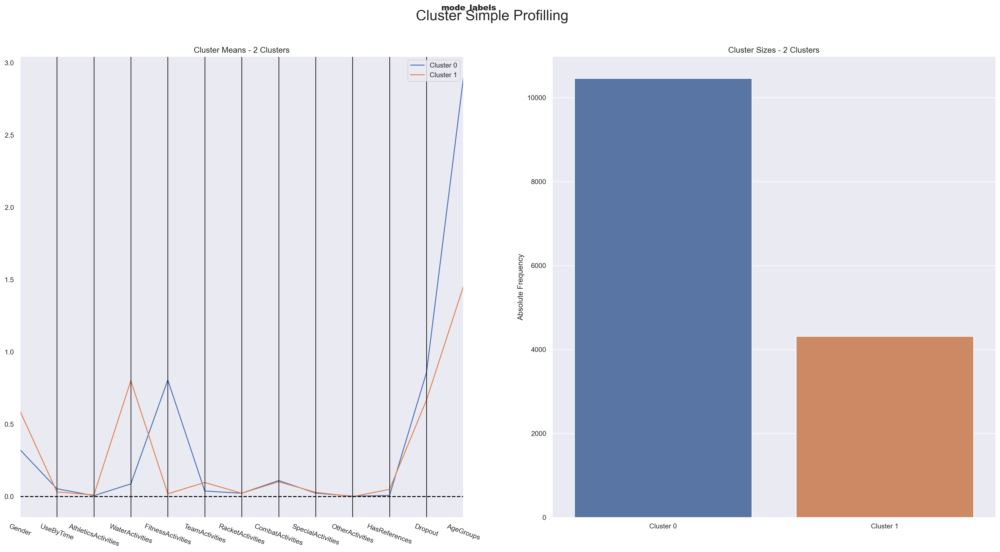

In [154]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    df3_concat_kmode = df3_concat_kmode[non_metric_features + ['mode_labels']], 
    label_columns = ['mode_labels'], 
    figsize = (28, 13), 
    compar_titles = ["mode_labels"]
)

## 4.3. Hierarchical Clustering

##### Combine K-Mode and K-Means, using Hierarchical Clustering

In [108]:
# Combine K-Modes and K-Means labels into a single matrix
combined_labels_matrix = np.column_stack((kmode_labels, kmeans_labels))

# Apply hierarchical clustering
hierarchical_clusters = linkage(combined_labels_matrix, method='ward')

# Determine the number of clusters using a distance threshold or another method
num_clusters = 7  # Adjust based on the analysis

# Assign instances to clusters based on the hierarchical clustering results
combined_labels_hierarchical = fcluster(hierarchical_clusters, num_clusters, criterion='maxclust')

# Combine the original DataFrame with the combined labels
df3_scaled_combined = pd.concat([df3_scaled, pd.Series(combined_labels_hierarchical, name='Combined_Labels')], axis=1)

In [109]:
# See the results
cluster_means_combined = df3_scaled_combined.groupby('Combined_Labels').mean()
cluster_means_combined

,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,TeamActivities,...,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,AgeGroups,TotalTimeOfEnrollment,TimeSinceLastVisit,RecentActivityPeriod,AverageVisitFrequency
Combined_Labels,,,,,,,,,,,,,,,,,,,,,
1.0,0.353560,0.373457,0.225872,0.075021,0.089800,0.050926,0.004630,0.283951,0.603395,0.043210,...,0.076903,0.193416,0.015432,0.004630,0.810185,2.495370,0.158208,0.374918,0.223373,0.030784
2.0,0.350902,0.436464,0.234672,0.089363,0.085795,0.058011,0.011050,0.262431,0.607735,0.044199,...,0.068562,0.180939,0.024862,0.009208,0.831492,2.447514,0.152800,0.395864,0.190434,0.030501
3.0,0.352655,0.377246,0.224362,0.078247,0.105229,0.038922,0.008982,0.305389,0.568862,0.047904,...,0.072106,0.210080,0.026946,0.010978,0.775449,2.491018,0.137307,0.396820,0.182430,0.028276
4.0,0.340078,0.393810,0.221616,0.070848,0.096078,0.045891,0.008538,0.312700,0.565635,0.057631,...,0.072157,0.197972,0.022412,0.008538,0.799360,2.443970,0.151128,0.381785,0.204367,0.027916
5.0,0.341111,0.382222,0.221405,0.075088,0.093660,0.052222,0.007778,0.328889,0.548889,0.054444,...,0.076049,0.193889,0.011111,0.004444,0.803333,2.417778,0.155210,0.360497,0.187089,0.029470
6.0,0.355852,0.417274,0.230065,0.075988,0.094936,0.047867,0.010406,0.292404,0.590010,0.048907,...,0.074503,0.198231,0.018730,0.006590,0.787721,2.470343,0.148052,0.373973,0.173411,0.028102
7.0,0.336719,0.430823,0.215951,0.065245,0.099192,0.047285,0.003503,0.266200,0.577933,0.073555,...,0.068520,0.213368,0.024518,0.008173,0.819615,2.434326,0.158576,0.368986,0.200372,0.025686


In [110]:
# Reset the index if needed
cluster_means_combined_reset = cluster_means_combined.reset_index()
cluster_means_combined_reset

,Combined_Labels,Age,Gender,Income,DaysWithoutFrequency,LifetimeValue,UseByTime,AthleticsActivities,WaterActivities,FitnessActivities,...,RealNumberOfVisits,NumberOfRenewals,HasReferences,NumberOfReferences,Dropout,AgeGroups,TotalTimeOfEnrollment,TimeSinceLastVisit,RecentActivityPeriod,AverageVisitFrequency
0,1.0,0.353560,0.373457,0.225872,0.075021,0.089800,0.050926,0.004630,0.283951,0.603395,...,0.076903,0.193416,0.015432,0.004630,0.810185,2.495370,0.158208,0.374918,0.223373,0.030784
1,2.0,0.350902,0.436464,0.234672,0.089363,0.085795,0.058011,0.011050,0.262431,0.607735,...,0.068562,0.180939,0.024862,0.009208,0.831492,2.447514,0.152800,0.395864,0.190434,0.030501
2,3.0,0.352655,0.377246,0.224362,0.078247,0.105229,0.038922,0.008982,0.305389,0.568862,...,0.072106,0.210080,0.026946,0.010978,0.775449,2.491018,0.137307,0.396820,0.182430,0.028276
3,4.0,0.340078,0.393810,0.221616,0.070848,0.096078,0.045891,0.008538,0.312700,0.565635,...,0.072157,0.197972,0.022412,0.008538,0.799360,2.443970,0.151128,0.381785,0.204367,0.027916
4,5.0,0.341111,0.382222,0.221405,0.075088,0.093660,0.052222,0.007778,0.328889,0.548889,...,0.076049,0.193889,0.011111,0.004444,0.803333,2.417778,0.155210,0.360497,0.187089,0.029470
5,6.0,0.355852,0.417274,0.230065,0.075988,0.094936,0.047867,0.010406,0.292404,0.590010,...,0.074503,0.198231,0.018730,0.006590,0.787721,2.470343,0.148052,0.373973,0.173411,0.028102
6,7.0,0.336719,0.430823,0.215951,0.065245,0.099192,0.047285,0.003503,0.266200,0.577933,...,0.068520,0.213368,0.024518,0.008173,0.819615,2.434326,0.158576,0.368986,0.200372,0.025686


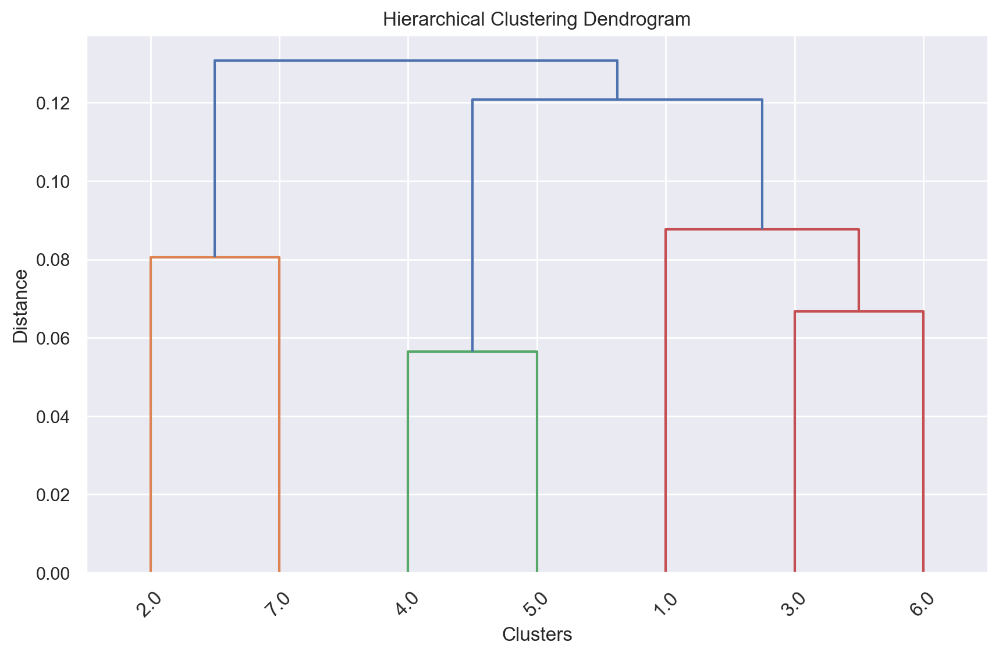

In [111]:
# Assuming 'cluster_means_combined' is your DataFrame
# Assuming cluster labels are in the index

# Drop the cluster label index before clustering
features_only = cluster_means_combined_reset.drop('Combined_Labels', axis=1)

# Perform hierarchical clustering
linkage_matrix = linkage(features_only, method='ward')

# Plot the dendrogram
plt.figure(figsize=(10, 6))
dendrogram(linkage_matrix, labels=cluster_means_combined.index, orientation='top', leaf_rotation=45)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Clusters')
plt.ylabel('Distance')
plt.show()

## 4.4. Clustering by 2 perspectives:
- value and demographics of costumer
- insights into sport activities that costumers participate in 

In [112]:
metric_features

['Age',
 'Income',
 'DaysWithoutFrequency',
 'LifetimeValue',
 'NumberOfFrequencies',
 'AttendedClasses',
 'AllowedWeeklyVisitsBySLA',
 'AllowedNumberOfVisitsBySLA',
 'RealNumberOfVisits',
 'NumberOfRenewals',
 'NumberOfReferences',
 'TotalTimeOfEnrollment',
 'TimeSinceLastVisit',
 'RecentActivityPeriod',
 'AverageVisitFrequency']

In [155]:
# Split variables into perspectives (only metric features)
demographic_features = ['Age','Income']

sports_features = ['NumberOfReferences','NumberOfRenewals''AttendedClasses',
                   'AllowedWeeklyVisitsBySLA','AllowedNumberOfVisitsBySLA','RealNumberOfVisits']

df_demog = df3_scaled[demographic_features].copy()
df_sports = df3_scaled[sports_features].copy()

KeyError: "['NumberOfRenewalsAttendedClasses'] not in index"

##### Test on k-means and hierarchical clustering
Number of clusters between 2 and 7, accordingly to k-mode (2 clusters) and k-means (6 clusters)

In [116]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df3_scaled.var() * (df3_scaled.count() - 1))
    return ss 

def r2(df3_scaled, labels):
    sst = get_ss(df3_scaled)
    ssw = np.sum(df3_scaled.groupby(labels).apply(get_ss))
    return 1 - ssw/sst
    
def get_r2_scores(df3_scaled, clusterer, min_k=2, max_k=7):
    """
    Loop over different values of k. To be used with sklearn clusterers.
    """
    r2_clust = {}
    for n in range(min_k, max_k):
        clust = clone(clusterer).set_params(n_clusters=n)
        labels = clust.fit_predict(df3_scaled)
        r2_clust[n] = r2(df3_scaled, labels)
    return r2_clust

# Set up the clusterers
kmeans = KMeans(
    init='k-means++',
    n_init=20,
    random_state=42)

hierarchical = AgglomerativeClustering(metric='euclidean')

##### Finding the optimal clusterer on demographic features

In [117]:
# Obtaining the R² scores for each cluster solution on demographic variables
r2_scores = {}
r2_scores['kmeans'] = get_r2_scores(df_demog, kmeans)

for linkage in ['complete', 'average', 'single', 'ward']:  
    r2_scores[linkage] = get_r2_scores(df_demog, hierarchical.set_params(linkage=linkage))

pd.DataFrame(r2_scores)

,kmeans,complete,average,single,ward
2,-1.0,-1.0,-1.0,-1.0,-1.0
3,-2.0,-2.0,-2.0,-2.0,-2.0
4,-3.0,-3.0,-3.0,-3.0,-3.0
5,-4.0,-4.0,-4.0,-4.0,-4.0
6,-5.0,-5.0,-5.0,-5.0,-5.0


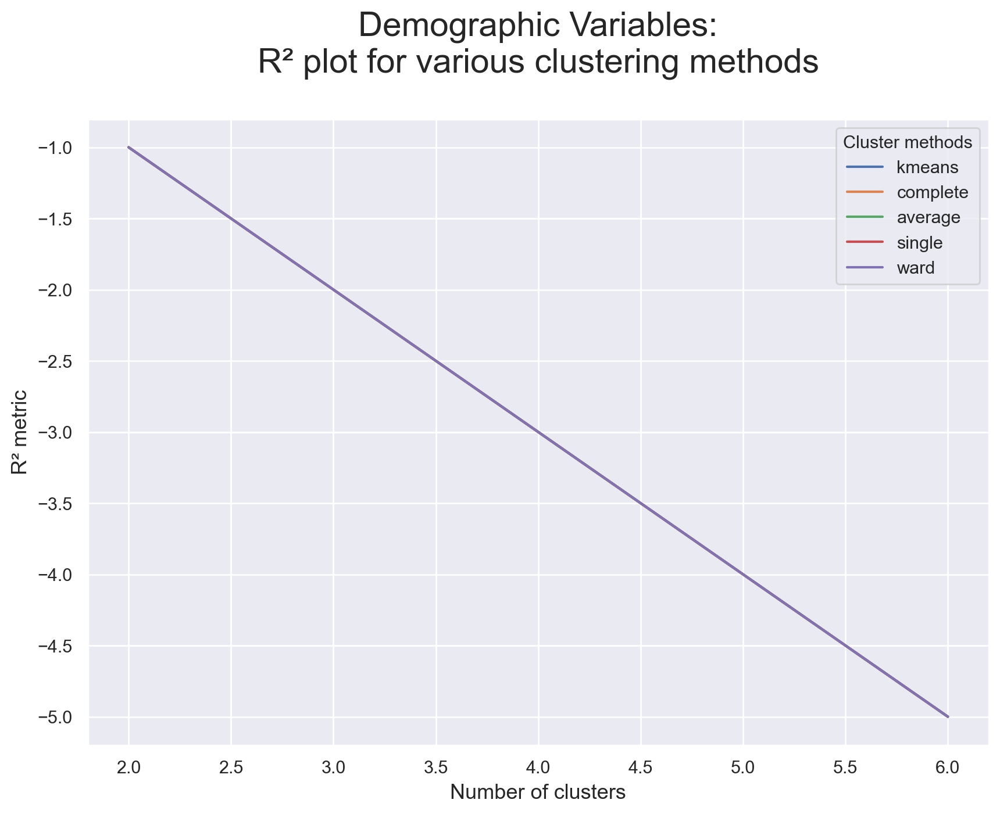

In [118]:
# Visualizing the R² scores for each cluster solution on demographic variables
pd.DataFrame(r2_scores).plot.line(figsize=(10,7))

plt.title("Demographic Variables:\nR² plot for various clustering methods\n", fontsize=21)
plt.legend(title="Cluster methods", title_fontsize=11)
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R² metric", fontsize=13)
plt.show()